<a href="https://colab.research.google.com/github/zzbn12345/FCIC24_Workshop_AI/blob/main/Lecture2_Social_and_Spatial_Network.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# COMPUATIONAL RESEARCH METHODS FOR THE BUILT ENVIRONMENT

## Lecture 2: Social and Spatial Networks in the Built Environment
Dr. Nan BAI

24 April 2024, Trial Lecture AE+T Sector Plan

Postdoc Research Fellow in Data Science and Artificial Intelligence | Public Administration and Policy Group | Wageningen University & Research

Guest Researcher | Marie Sklodowska-Curie Early-Stage Researcher | Department of Architectural Engineering + Technology | Delft University of Technology

### Introduction

This is a Python notebook hosted on Google Colab that you can follow to reproduce many of the results presented during the **Lecture 2 Social and Spatial Networks in the Built Environment**.

You have the chance to bring in your own case-study city and collect your own network datasets in ready-to-use formats for further research and heritage investigations. You can try to represent the city as a graph, and find out the nodes with the highest degrees and other centrality metrics.

You probably need some knowledge in programming to understand what happens in each part. However, it does not matter that much if you do not. Just walk through all the steps and you will at least have some interesting results at hand.

After this lecture, you will have the:
* **[Knowledge]** to describe a social network of people in space and a spatial network in the built environment (building/cities) using the terminology of network **centrality** analysis

* **[Skills]** to construct a social or a spatial network and represent the network structure that can be understood by computers

* **[Attitude]** to prepare spatial network models for describing the urban built heritage using computational tools

### Basic Settings and Preparations

#### Imports and Installations

In [5]:
!pip install osmnx

In [6]:
# imports the various library for the lab
import numpy as np
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import osmnx as ox # this line imports osmnx
import networkx as nx # this line imports networkx
import matplotlib.cm as cm
import matplotlib.colors as colors
import pickle

from argparse import Namespace
import urllib
import pathlib
from google.colab import userdata
from google.colab import drive
#from IPython.display import IFrame
#ox.config(log_console=True, use_cache=True)

import sys
print (f'current environment: {sys.prefix}')

current environment: /usr


In [7]:
print (f'current osmnx version: {ox.__version__}')

current osmnx version: 1.9.2


In [8]:
import geopandas as gpd
print (f'current geopandas version: {gpd.__version__}')

current geopandas version: 0.13.2


#### Mounting Google Drive

In [10]:
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


After mounting to the Google Drive, you can see its folders by clicking on the Files tab on the left of the Colab notebook. You can also access your downloaded data later.

#### Making a Folder for this Workshop

First tell us how you would love to call your case study city! Please do not use any space in the name. Next time you can also change this case name for another case study that you are interested in.

In [11]:
case_name = 'Delf Campus'

Let's make a new folder in your Google Drive for the rest of this project

In [12]:
folder = '/content/drive/MyDrive/FCIC_workshop/' + case_name + '/'
pathlib.Path(folder).mkdir(parents=True, exist_ok=True)

#### User Inputs

In [13]:
args = Namespace(
    # Please paste the geolocation of your case study city here
    lat = 52.00667,
    lon = 4.3556,
    # The radius is in the unit of km
    radius = 1,
    save_dir = folder,
)

In [14]:
args.save_dir

'/content/drive/MyDrive/FCIC_workshop/Delf Campus/'

### Data Collection

#### Introducing OSMnx

OSMnx, or **"OpenStreetMap network"**, is a Python package for downloading administrative boundary shapes and street networks from OpenStreetMap. It allows you to easily construct, project, visualize, and analyze complex street networks in Python with NetworkX.

For instance, you could easily get a city’s or neighborhood’s walking, driving, or biking network with a single line of Python code. Then you can simply visualize cul-de-sacs or one-way streets, plot shortest-path routes, or calculate stats like intersection density, average node connectivity, degree distributions, or closeness and betweenness centrality. These are all really useful techniques in research of built environment.

**If you are interested to read more about the package, here are some links:**

* Boeing, G. 2017. [“OSMnx: New Methods for Acquiring, Constructing, Analyzing, and Visualizing Complex Street Networks.” Computers, Environment and Urban Systems. 65, 126-139.](https://geoffboeing.com/publications/osmnx-complex-street-networks/)

* [Web Article - OSMnx: Python for Street Networks](https://geoffboeing.com/2016/11/osmnx-python-street-networks/)

* And for more practice, please see the the [many examples provided from Geoff Boeing](https://github.com/gboeing/osmnx-examples/).

#### Downloading the Spatial Network in a City

##### All network

In [18]:
G = ox.graph_from_point((args.lat, args.lon), dist=args.radius * 1500, network_type='all')
G_proj = ox.projection.project_graph(G, to_latlong=True)

In [19]:
tags={'amenity': True, 'highway':True, 'landuse':True, 'building':True, 'waterway': True, 'railway': True}
all_geom=ox.features.features_from_point((args.lat, args.lon),  tags, dist=args.radius * 1500)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


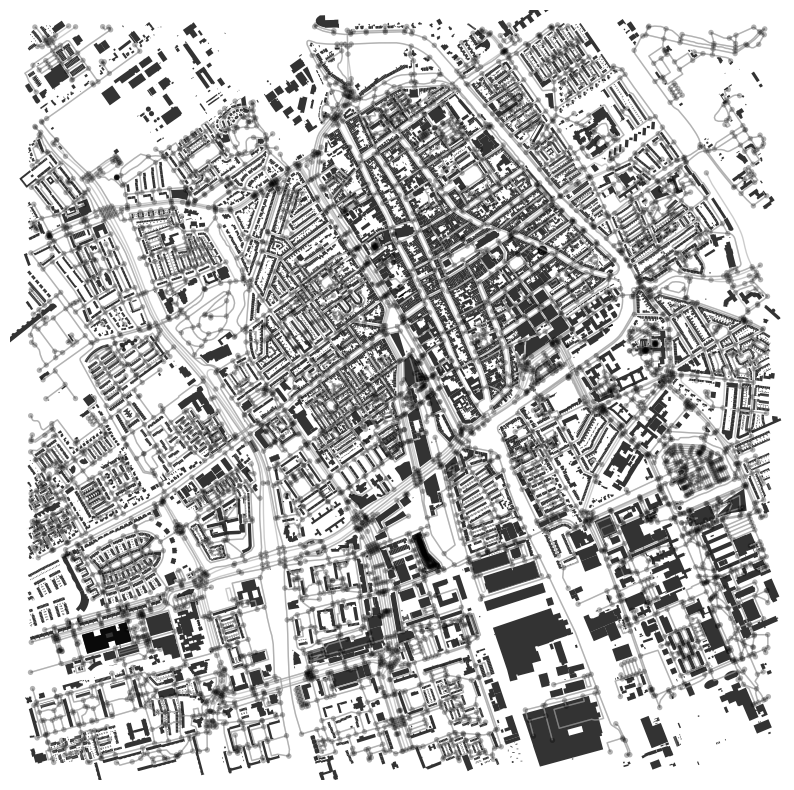

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black', alpha=0.8)
ox.plot_graph(G_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


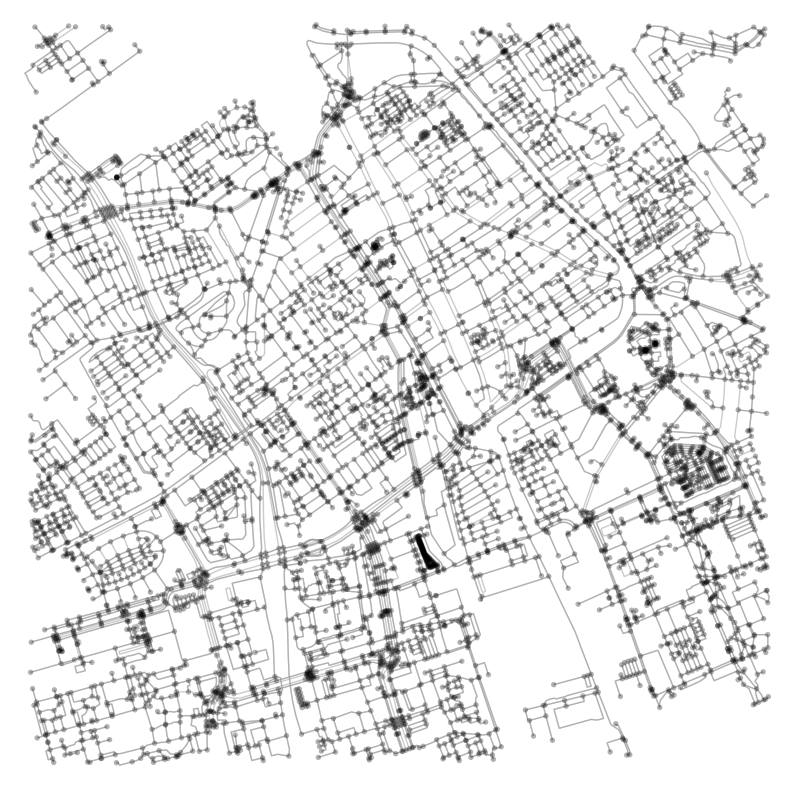

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
ox.plot_graph(G_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

##### Bike Network

In [ ]:
G_bike = ox.graph_from_point((args.lat, args.lon), dist=args.radius * 1500, network_type='bike')
G_bike_proj = ox.projection.project_graph(G_bike, to_latlong=True)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


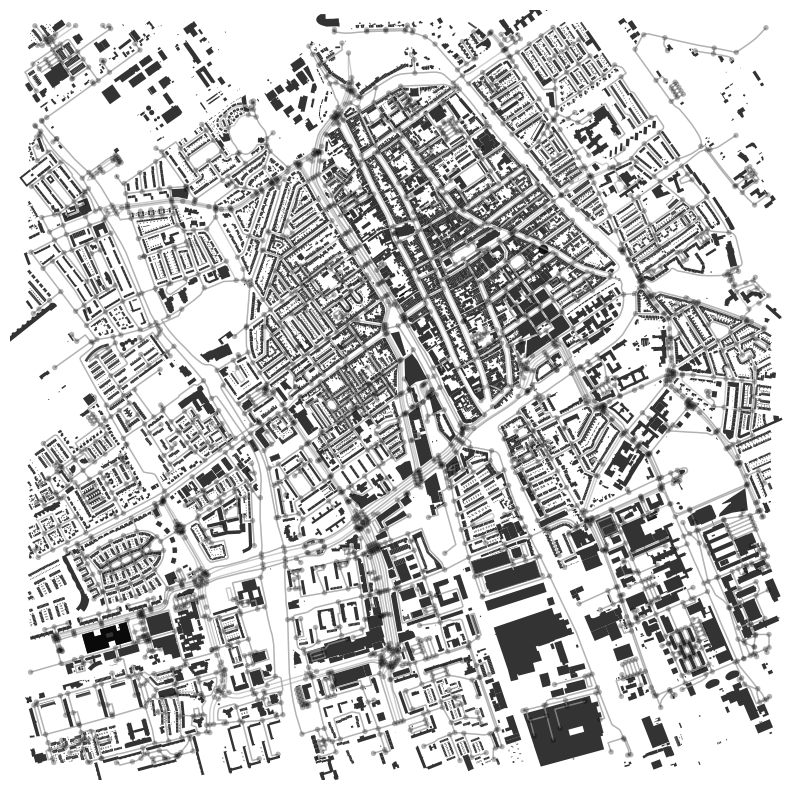

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black', alpha=0.8)
ox.plot_graph(G_bike_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

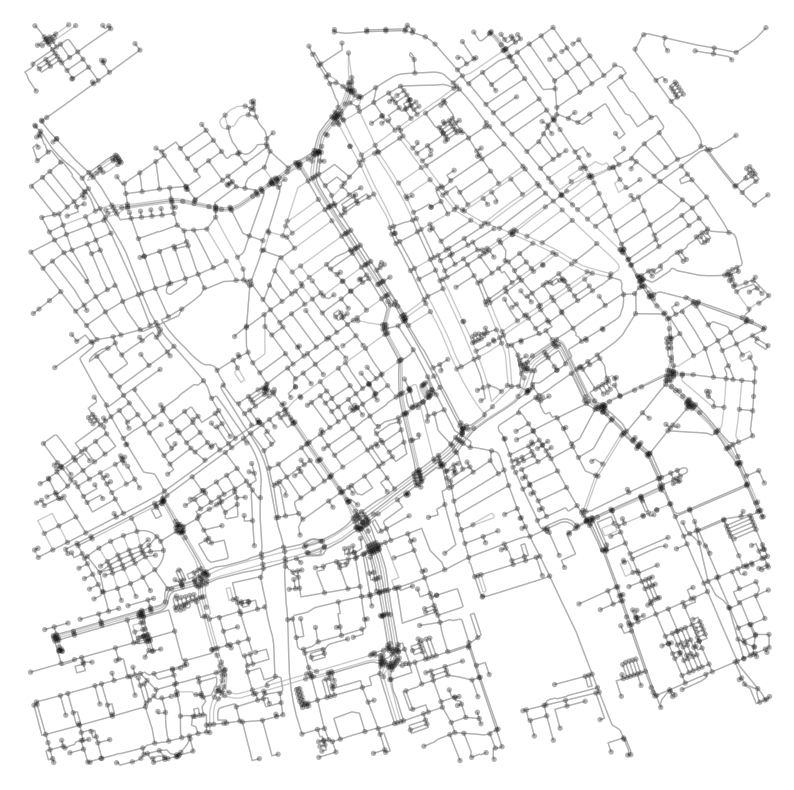

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
ox.plot_graph(G_bike_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

##### Drive Network

In [ ]:
G_drive = ox.graph_from_point((args.lat, args.lon), dist=args.radius * 1500, network_type='drive')
G_drive_proj = ox.projection.project_graph(G_bike, to_latlong=True)

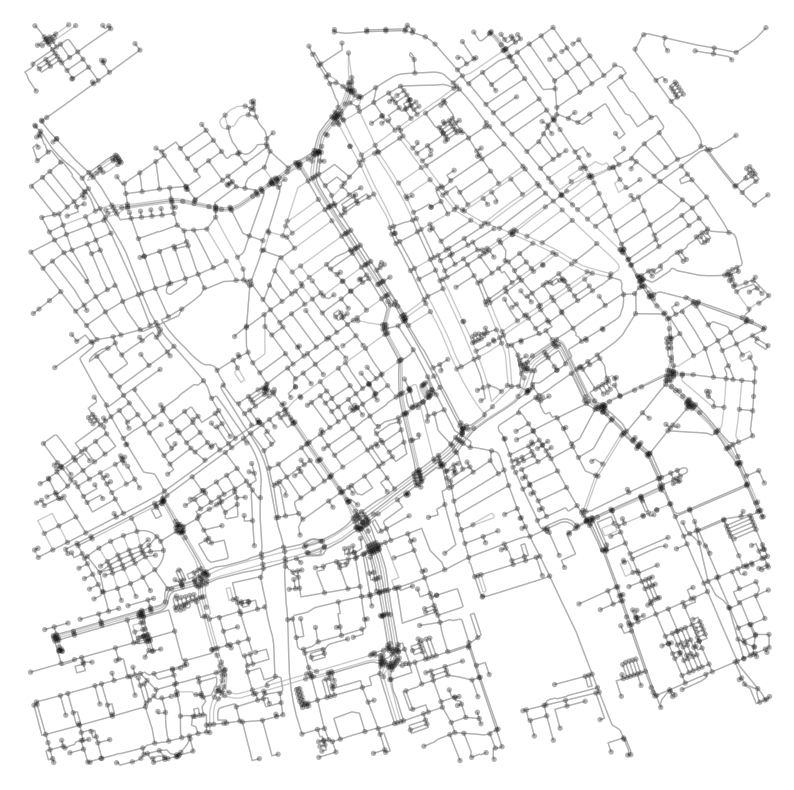

In [ ]:
fig,ax = plt.subplots(figsize=(10,10))
ox.plot_graph(G_drive_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

plt.axis('off')
plt.show()

#### Temporally Saving the Graph

In [ ]:
len(G_bike_proj.nodes())

3045

In [ ]:
len(G_bike_proj.edges())

7609

In [ ]:
with open(args.save_dir + 'bike_Grpah.p', 'wb') as fp:
  pickle.dump([G_bike, G_bike_proj], fp)

In [16]:
with open(args.save_dir + 'bike_Grpah.p', 'rb') as fp:
  G_bike, G_bike_proj = pickle.load(fp)

In [20]:
with open(args.save_dir + 'all_Grpah.p', 'wb') as fp:
  pickle.dump([G, G_proj], fp)

In [21]:
with open(args.save_dir + 'all_Grpah.p', 'rb') as fp:
  G, G_proj = pickle.load(fp)

### Graph Statistics and Analysis

#### Basic Statistics

In [22]:
stats = ox.basic_stats(G_bike_proj)
stats

{'n': 3045,
 'm': 7609,
 'k_avg': 4.997701149425287,
 'edge_length_total': 389655.55100000073,
 'edge_length_avg': 51.209824024181984,
 'streets_per_node_avg': 2.9198686371100164,
 'streets_per_node_counts': {0: 0,
  1: 479,
  2: 30,
  3: 1827,
  4: 677,
  5: 29,
  6: 3},
 'streets_per_node_proportions': {0: 0.0,
  1: 0.15730706075533663,
  2: 0.009852216748768473,
  3: 0.6,
  4: 0.22233169129720853,
  5: 0.009523809523809525,
  6: 0.0009852216748768472},
 'intersection_count': 2566,
 'street_length_total': 222091.5499999997,
 'street_segment_count': 4391,
 'street_length_avg': 50.57880892735133,
 'circuity_avg': 1.0489673317780452,
 'self_loop_proportion': 0.0031883397859257573}

You will notice this network has `3045` nodes and `7609` edges with an average street length of `50.6m`, average streets per node of `2.92`. The node with largest degree has 6 streets connected to it.

#### Graph Representations

Edge List

In [ ]:
nx.to_pandas_edgelist(G_bike_proj)

,source,target,tunnel,name,length,highway,service,junction,geometry,bridge,access,osmid,width,oneway,reversed,maxspeed,lanes
0,26017586,7617332358,NaN,Pieterstraat,22.443,pedestrian,NaN,NaN,NaN,NaN,NaN,815610369,NaN,False,True,NaN,NaN
1,26017586,1575265113,NaN,Paradijspoort,66.658,pedestrian,NaN,NaN,"LINESTRING (4.3625014 52.0099206, 4.362374 52....",NaN,NaN,7538772,NaN,False,False,NaN,NaN
2,26017586,44841573,NaN,Paradijspoort,57.961,pedestrian,NaN,NaN,"LINESTRING (4.3625014 52.0099206, 4.3629616 52...",NaN,NaN,7538772,NaN,False,True,NaN,NaN
3,7617332358,26017586,NaN,Pieterstraat,22.443,pedestrian,NaN,NaN,NaN,NaN,NaN,815610369,NaN,False,False,NaN,NaN
4,1575265113,1575265140,NaN,Molslaan,77.434,pedestrian,NaN,NaN,"LINESTRING (4.3618939 52.0103778, 4.3626976 52...",NaN,NaN,7538771,NaN,False,False,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7604,11597514376,11597514375,NaN,NaN,34.787,service,parking_aisle,NaN,"LINESTRING (4.3379868 52.0200879, 4.3381158 52...",NaN,NaN,1247526426,NaN,False,False,NaN,NaN
7605,11734529623,11734529627,NaN,NaN,14.657,service,NaN,NaN,NaN,NaN,NaN,1262978574,NaN,False,False,30,NaN
7606,11734529623,11734529628,NaN,NaN,7.360,service,NaN,NaN,NaN,NaN,NaN,1262978574,NaN,False,True,30,NaN
7607,11734529623,11734529621,NaN,NaN,56.115,service,NaN,NaN,"LINESTRING (4.3708773 51.9991902, 4.3708543 51...",NaN,NaN,1262978571,NaN,False,True,NaN,NaN


Adjacency Matrix

In [ ]:
nx.to_pandas_adjacency(G_bike_proj)

,26017586,7617332358,1575265113,44841573,27082283,5124502147,1015968754,1435380997,30578268,260123525,...,11587540793,11587540787,11587540792,11587540810,11587540799,11587540797,11597514375,11597514376,11734529623,11734529628
26017586,0.0,1.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
7617332358,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1575265113,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
44841573,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
27082283,0.0,0.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11587540797,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
11597514375,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
11597514376,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
11734529623,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0


#### Network Metrics

##### Degree

In [ ]:
# some of the centrality measures are not implemented on multiGraph so first set as diGraph
DG = ox.convert.to_digraph(G_bike_proj)

In [ ]:
# let's first calculate its node degree centrality
node_dc = nx.degree_centrality(DG)

# after this you need to first set the attributes back to its edge
nx.set_node_attributes(DG, node_dc,'dc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

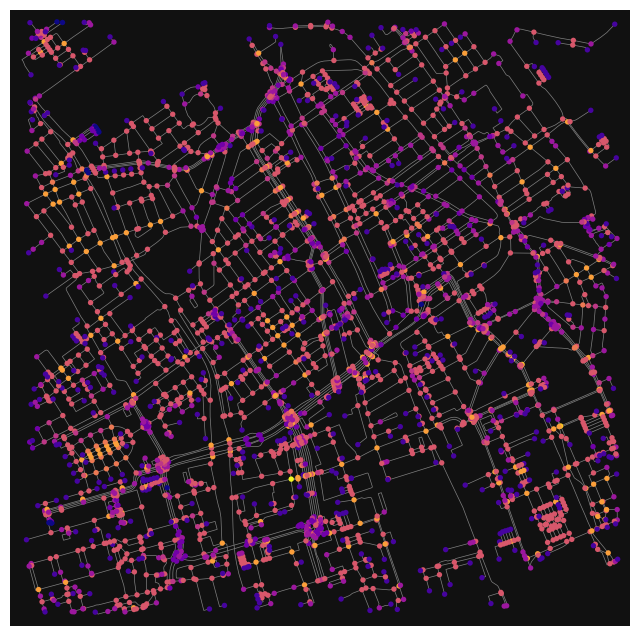

In [ ]:
# you can then color the nodes in the original graph with their degree centralities
nc = ox.plot.get_node_colors_by_attr(G1, 'dc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=15, node_color=nc,
                        edge_color='gray', edge_linewidth=0.5, edge_alpha=1)

In [ ]:
# you can also calculate its edge degree centrality: convert graph into a line graph so edges become nodes and vice versa
edge_dc = nx.degree_centrality(nx.line_graph(DG))

# after this you need to first set the attributes back to its edge
nx.set_edge_attributes(DG, edge_dc,'dc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

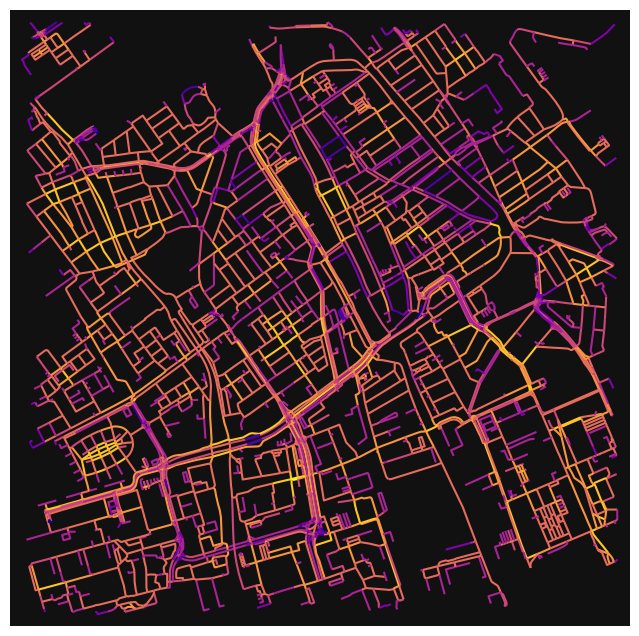

In [ ]:
# you can then color the edges in the original graph with degree centralities in the line graph
nc = ox.plot.get_edge_colors_by_attr(G1, 'dc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

##### Closeness Centrality

In [ ]:
# let's first calculate its node degree centrality
node_cc = nx.closeness_centrality(DG)

# after this you need to first set the attributes back to its edge
nx.set_node_attributes(DG, node_cc,'cc')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


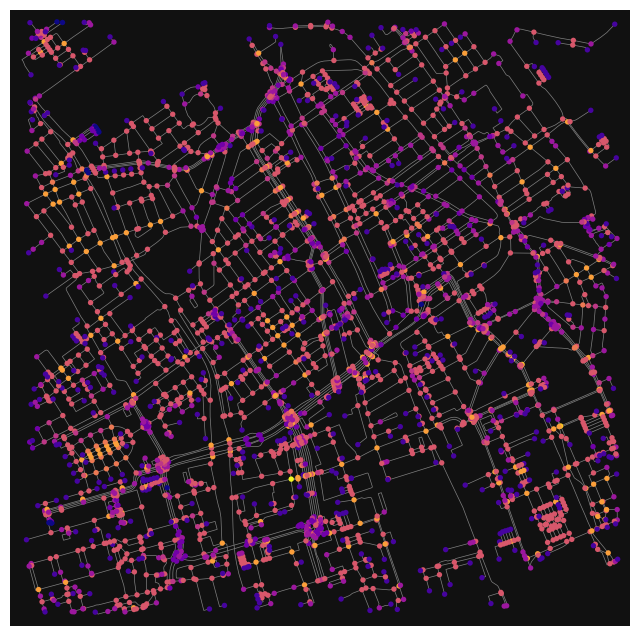

In [ ]:
# you can then color the nodes in the original graph with their degree centralities
nc = ox.plot.get_node_colors_by_attr(G1, 'dc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=15, node_color=nc,
                        edge_color='gray', edge_linewidth=0.5, edge_alpha=1)

In [ ]:
# similarly, let's calculate edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_cc = nx.closeness_centrality(nx.line_graph(DG))

# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_cc,'cc')
G1 = nx.MultiGraph(DG)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


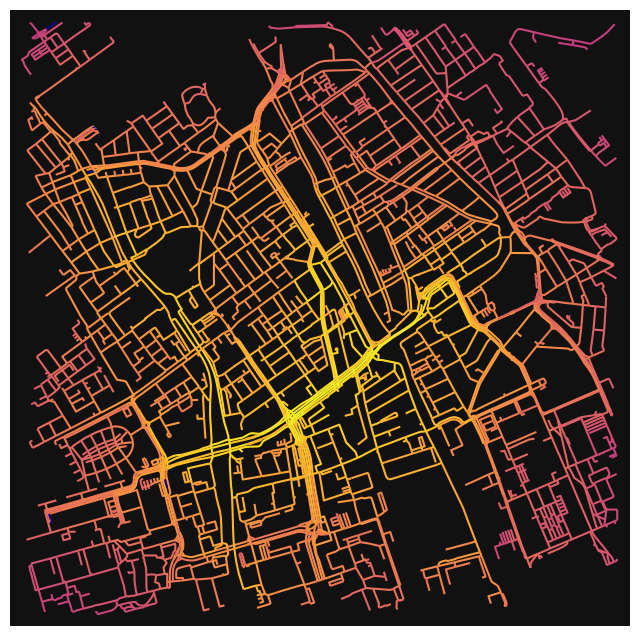

In [ ]:
nc = ox.plot.get_edge_colors_by_attr(G1, 'cc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

##### Betweenness Centrality

In [ ]:
# similarly, let's calculate edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_bc = nx.betweenness_centrality(nx.line_graph(DG))

# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_bc,'bc')
G1 = nx.MultiGraph(DG)

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


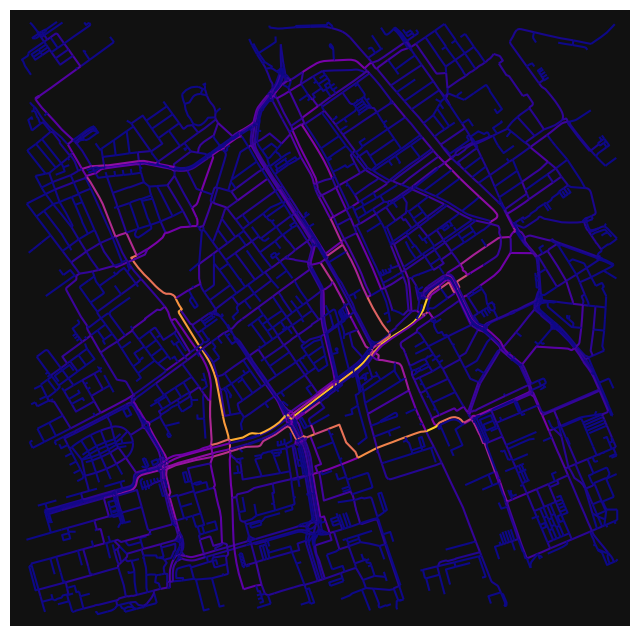

In [ ]:
nc = ox.plot.get_edge_colors_by_attr(G1, 'bc', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

##### PageRank

In [ ]:
# let's first calculate its node degree centrality
node_pr = nx.pagerank(DG)

# after this you need to first set the attributes back to its edge
nx.set_node_attributes(DG, node_pr,'pr')

# and turn back to multiGraph for plotting
G1 = nx.MultiGraph(DG)

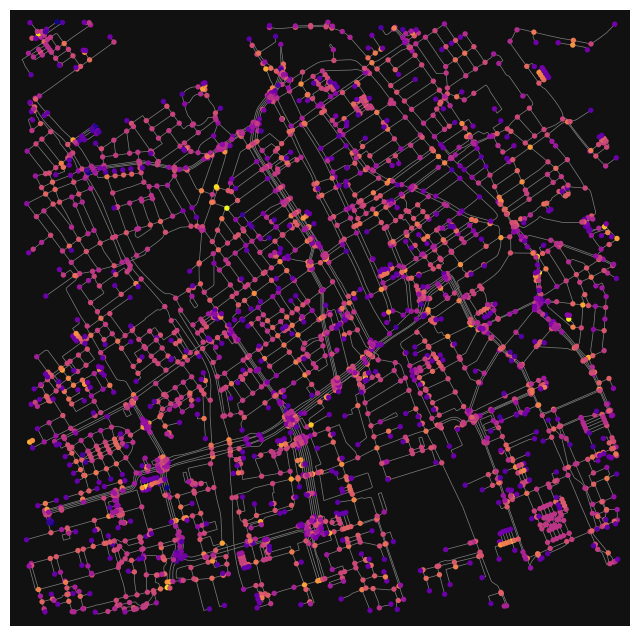

In [ ]:
nc = ox.plot.get_node_colors_by_attr(G1, 'pr', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=15, node_color=nc,
                        edge_color='gray', edge_linewidth=0.5, edge_alpha=1)

In [ ]:
# similarly, let's calculate edge closeness centrality: convert graph to a line graph so edges become nodes and vice versa
edge_pr = nx.pagerank(nx.line_graph(DG))

# set or inscribe the centrality measure of each node as an edge attribute of the graph network object
nx.set_edge_attributes(DG,edge_pr,'pr')
G1 = nx.MultiGraph(DG)

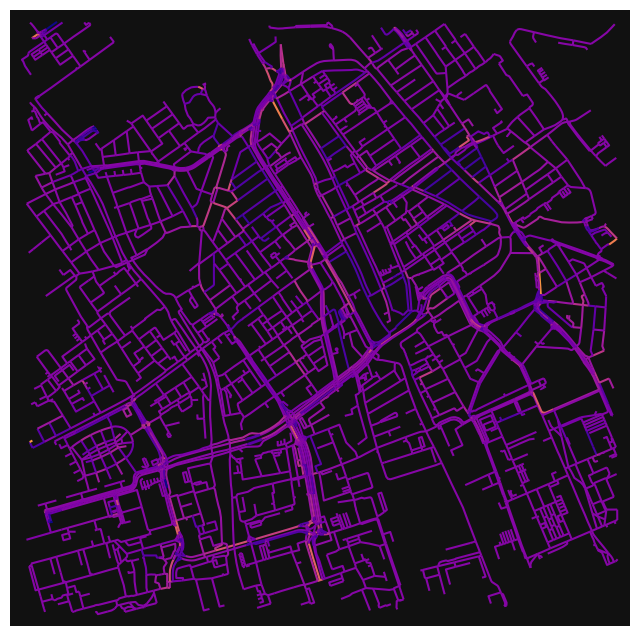

In [ ]:
nc = ox.plot.get_edge_colors_by_attr(G1, 'pr', cmap='plasma')
fig, ax = ox.plot_graph(G1, node_size=0, node_color='w', node_edgecolor='gray', node_zorder=2,
                        edge_color=nc, edge_linewidth=1.5, edge_alpha=1)

### Additional Downloading of Social Media Posts

#### Preparations

In [23]:
!pip install flickrapi

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 1.6 MB/s eta 0:00:00


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
/usr/local/lib/python3.10/dist-packages/google/colab/_pip.py:86: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib

In [57]:
import flickrapi
import json
import os
from keras.preprocessing import image
from keras.applications.imagenet_utils import decode_predictions, preprocess_input
from keras.models import Model
from scipy.spatial import distance
import random
from sklearn.manifold import TSNE
from PIL import Image

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


In [25]:
args = Namespace(
    # Please paste your API key and secret in your Google Colab environment
    api_key = u'{}'.format(userdata.get('api_key')),
    api_secret = u'{}'.format(userdata.get('api_secret')),
    # Please paste the geolocation of your case study city here
    lat = 52.00667,
    lon = 4.3556,
    # The radius is in the unit of km
    radius = 1,
    save_dir = folder + 'data_storage/',
    image_dir = folder + 'data_storage/images/',
    # Set a limit to the images to be collected
    maximum_images = 3000,
    tags=[],
)

In [26]:
args.save_dir

'/content/drive/MyDrive/FCIC_workshop/Delf Campus/data_storage/'

In [27]:
def collect_ids(flickr, lat, lon, radius, tags = None):

    if 'photo_ids.csv' in [files for root, dirs, files in os.walk(args.save_dir)][0]:
        Ids = pd.read_csv(args.save_dir+'photo_ids.csv', sep='\t')['ids'].tolist()
    else:
        Ids = []

    walk = flickr.walk(has_geo = 1, lat = args.lat, lon = args.lon, radius = args.radius, tags=args.tags)
    for photo in walk:
        id_now = photo.get('id')
        if id_now in Ids:
            continue
        Ids.append(id_now)
        if len(Ids)%50 == 0:
            print('{} photo ids collected'.format(len(Ids)))
            pd.Series(Ids, name = 'ids').to_csv(args.save_dir + 'photo_ids.csv', index=False)
        if len(Ids)>=args.maximum_images:
          break
    pd.Series(Ids, name = 'ids').to_csv(args.save_dir + 'photo_ids.csv', index=False)
    return Ids

def get_photos(flickr, Photos, Ids):
    processed = Photos.keys()
    for id_now in Ids:
        if id_now in processed:
            continue
        else:
            Photos[id_now] = {}
            sizes = json.loads(flickr.photos.getSizes(photo_id = id_now, format='json'))
            info = json.loads(flickr.photos.getInfo(photo_id = id_now, format='json'))
            try:
                url_c = sizes['sizes']['size'][-2]['source']
                url_q = sizes['sizes']['size'][1]['source']
                can = sizes['sizes']['candownload']
                Photos[id_now]['candownload'] = can
                Photos[id_now]['url_q'] = url_q
                Photos[id_now]['owner'] = info['photo']['owner']['nsid']
                Photos[id_now]['owner_loc'] = info['photo']['owner']['location']
                Photos[id_now]['title'] = info['photo']['title']['_content']
                Photos[id_now]['description'] = info['photo']['description']['_content']
                Photos[id_now]['comments'] = info['photo']['comments']['_content']
                Photos[id_now]['taken'] = info['photo']['dates']['taken']
                Photos[id_now]['views'] = info['photo']['views']
                Photos[id_now]['people'] = info['photo']['people']['haspeople']
                Photos[id_now]['tags'] = info['photo']['tags']['tag']
                Photos[id_now]['lat'] = info['photo']['location']['latitude']
                Photos[id_now]['lon'] = info['photo']['location']['longitude']
                Photos[id_now]['neighbourhood'] = info['photo']['location']['neighbourhood']['_content']
                Photos[id_now]['url'] = info['photo']['urls']['url'][0]['_content']

                if can:
                    urllib.request.urlretrieve(url_q, args.image_dir+'{}.jpg'.format(id_now))

                if len(processed)%50 ==0:
                    print('{}/{} photos collected'.format(len(processed),len(Ids)))
                    with open(args.image_dir+'Photo_sizes.p', 'wb') as fp:
                        pickle.dump(Photos,fp, protocol=pickle.HIGHEST_PROTOCOL)
                    photo_df = pd.DataFrame(Photos).T
                    photo_df.to_csv(args.image_dir+'photos_sizes.csv', sep='\t',encoding='utf-8-sig')
            except:
                print(id_now)
                continue

    with open(args.image_dir+'Photo_sizes.p', 'wb') as fp:
        pickle.dump(Photos,fp, protocol=pickle.HIGHEST_PROTOCOL)
    photo_df = pd.DataFrame(Photos).T
    photo_df.to_csv(args.image_dir+'photos_sizes.csv', sep='\t',encoding='utf-8-sig')
    return Photos


def load_image(path):
    img = image.load_img(path, target_size=[224,224])
    x = image.img_to_array(img)
    x = np.expand_dims(x, axis=0)
    #x = preprocess_input(x)
    return img, x


def get_closest_images(query_image_idx, num_results=5):
    distances = [ distance.cosine(pca_features[query_image_idx], feat) for feat in pca_features ]
    idx_closest = sorted(range(len(distances)), key=lambda k: distances[k])[1:num_results+1]
    return idx_closest

def get_concatenated_images(indexes, thumb_height):
    thumbs = []
    for idx in indexes:
        img = image.load_img(images[idx])
        img = img.resize((int(img.width * thumb_height / img.height), thumb_height))
        thumbs.append(img)
    concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)
    return concat_image

#### Data Collection

In [28]:
flickr = flickrapi.FlickrAPI(args.api_key, args.api_secret)
if not 'data_storage' in os.listdir(folder):
  os.mkdir(args.save_dir)
Ids = collect_ids(flickr, args.lat, args.lon, args.radius, args.tags)

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


In [29]:
len(Ids)

3001

In [30]:
if not 'images' in os.listdir(args.save_dir):
  os.mkdir(args.image_dir)

if 'Photo_sizes.p' in [files for root, dirs, files in os.walk(args.image_dir)][0]:
  with open(args.image_dir+'Photo_sizes.p', 'rb') as fp:
      Photos = pickle.load(fp)
else:
  Photos = {}
  Photos = get_photos(flickr, Photos, Ids)

In [31]:
len(Photos)

3000

In [33]:
img_df = pd.read_csv(args.image_dir+'photos_sizes.csv',sep='\t').rename(columns={'Unnamed: 0':'ids'})
img_df.head()

,ids,candownload,url_q,owner,owner_loc,title,description,comments,taken,views,people,tags,lat,lon,neighbourhood,url
0,53653135424,0,https://live.staticflickr.com/65535/5365313542...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:23:16,0,0,"[{'id': '13730308-53653135424-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
1,53651915732,0,https://live.staticflickr.com/65535/5365191573...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:23:31,0,0,"[{'id': '13730308-53651915732-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
2,53653006528,0,https://live.staticflickr.com/65535/5365300652...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:29:50,0,0,"[{'id': '13730308-53653006528-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
3,53653135324,0,https://live.staticflickr.com/65535/5365313532...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:29:32,0,0,"[{'id': '13730308-53653135324-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...
4,53653006463,0,https://live.staticflickr.com/65535/5365300646...,13735648@N05,"Rotterdam, Netherlands",NaN,NaN,0,2024-04-12 22:29:57,0,0,"[{'id': '13730308-53653006463-536', 'author': ...",52.009777,4.355577,NaN,https://www.flickr.com/photos/seustace2003/536...


In [34]:
img_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3000 entries, 0 to 2999
Data columns (total 16 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   ids            3000 non-null   int64  
 1   candownload    3000 non-null   int64  
 2   url_q          3000 non-null   object 
 3   owner          3000 non-null   object 
 4   owner_loc      2233 non-null   object 
 5   title          1861 non-null   object 
 6   description    1037 non-null   object 
 7   comments       3000 non-null   int64  
 8   taken          3000 non-null   object 
 9   views          3000 non-null   int64  
 10  people         3000 non-null   int64  
 11  tags           3000 non-null   object 
 12  lat            3000 non-null   float64
 13  lon            3000 non-null   float64
 14  neighbourhood  0 non-null      float64
 15  url            3000 non-null   object 
dtypes: float64(3), int64(5), object(8)
memory usage: 375.1+ KB


In [35]:
img_df['candownload'].sum()

1790

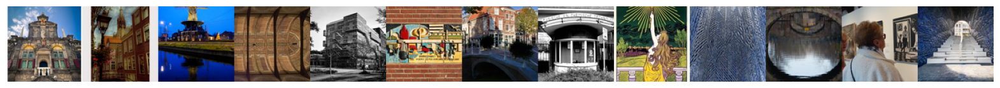

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


In [36]:
# load all the similarity results as thumbnails of height 100
thumbs = []
for idx in img_df[img_df['views']>img_df['views'].quantile(0.99)].sort_values(by='views', ascending=False)['ids']:
    try:
        img = image.load_img(args.image_dir+str(idx)+'.jpg')
        img = img.resize((int(img.width * 100 / img.height), 100))
        thumbs.append(img)
    except:
        continue

# concatenate the images into a single image
concat_image = np.concatenate([np.asarray(t) for t in thumbs], axis=1)

# show the image
plt.figure(figsize = (20,12))
plt.axis('off')
plt.imshow(concat_image)

In [37]:
img_df['owner_loc'].unique()

array(['Rotterdam, Netherlands', nan, 'Delft, Netherlands', 'Pau, France',
       'delft, the Netherlands', 'Netherlands', 'Den Haag, Netherlands',
       'London, England, United Kingdom', 'Lanaken, Belgie',
       'Düsseldorf-Hubbelrath, Deutschland / Germany',
       'Amsterdam Haarlem Nederland, Netherlands', 'Breda, Netherlands',
       'The Netherlands', 'Amsterdam, Netherlands', 'Köln, Deutschland',
       'Nantes, France', 'Roma, Italy', 'Aosta, Italia', 'Kissimmee, USA',
       'Province Limburg, The Netherlands', 'Oldehove, Netherlands',
       'Nieuwerkerk aan den IJssel, The Netherlands', 'Voorburg',
       'Croydon', 'Guadix (Granada), Spain', 'Scottsdale, AZ, USA',
       'Chattanooga, TN, United States', 'NL', 'delft / netherlands',
       'Delft, The Netherlands', 'São Paulo, Brazil',
       'Amersfoort, Netherlands', 'Essen, Germany', 'Belgium',
       'Naaldwijk, Netherlands', 'London, UK', 'Mönchengadbach',
       'Voerendaal, Netherlands', 'Hoofddorp, Netherlands',


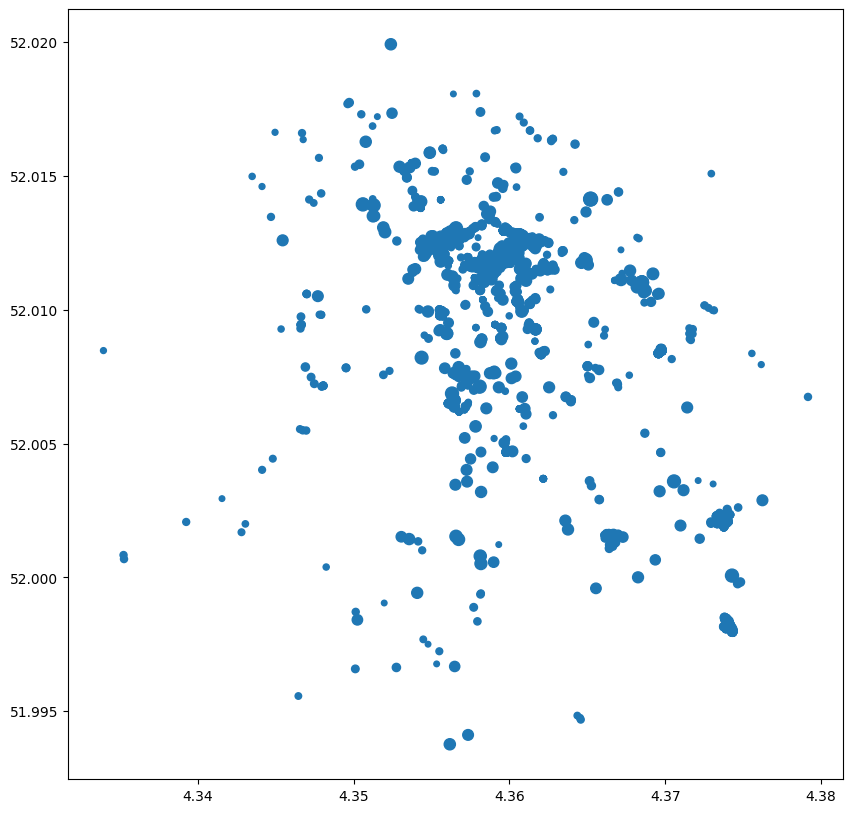

In [38]:
plt.figure(figsize=(10,10))
plt.scatter(img_df['lon'],img_df['lat'], s=10*np.log(img_df['views']+5))

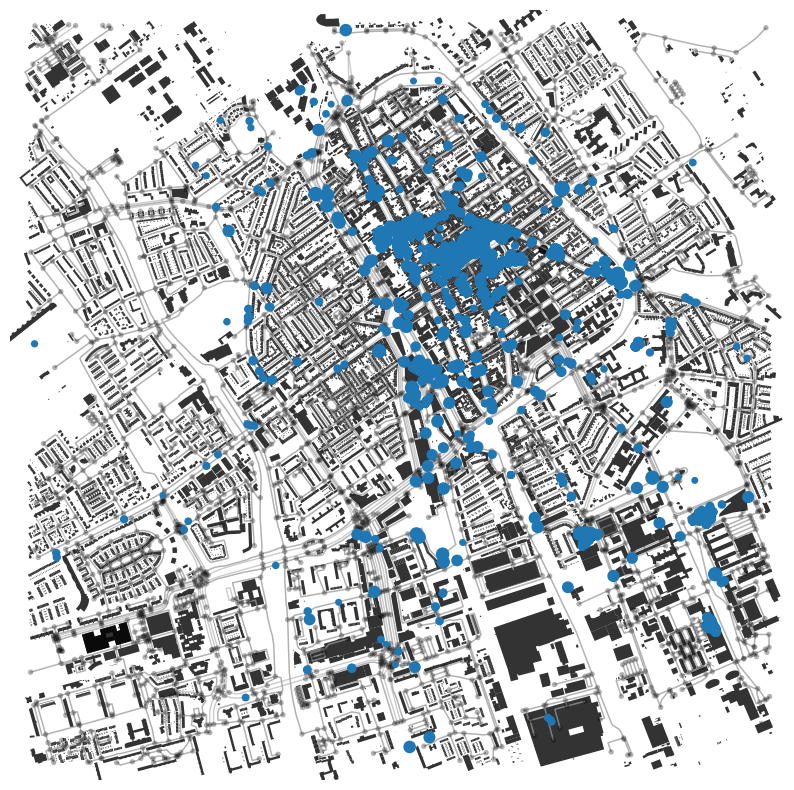

In [39]:
fig,ax = plt.subplots(figsize=(10,10))
all_geom[all_geom['building'].notna()].plot(ax=ax,color='black', alpha=0.8)
ox.plot_graph(G_bike_proj, figsize=(10, 10), bgcolor='w', node_color='k', node_alpha = 0.3, edge_alpha = 0.5, ax=ax, show=False)

ax.scatter(img_df['lon'],img_df['lat'], s=10*np.log(img_df['views']+5))
plt.axis('off')
plt.show()

In [40]:
img_df['date'] = img_df['taken'].apply(lambda x: int(x[:4]))

In [41]:
img_df['date'].describe()

count    3000.000000
mean     2023.168333
std         1.412797
min      1975.000000
25%      2023.000000
50%      2023.000000
75%      2024.000000
max      2024.000000
Name: date, dtype: float64

<Axes: >

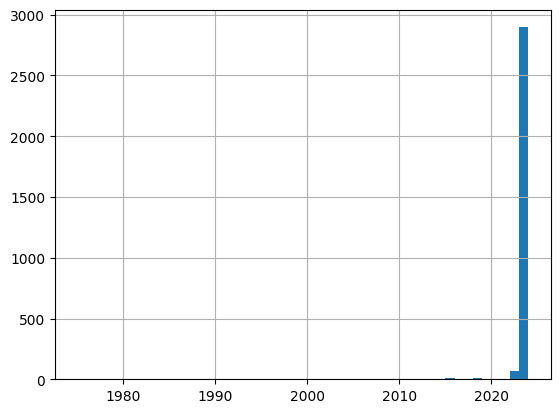

In [42]:
img_df['date'].hist(bins=img_df['date'].max() - img_df['date'].min())

### Image Processing using AI Models

#### Loading a Pre-Trained Computer Vision Model

In [43]:
from tensorflow.keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet', include_top=True)

<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


553467096/553467096 [==============================] - 8s 0us/step


In [44]:
model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

#### Extrating the Visual Features of Images

In [45]:
feat_extractor = Model(inputs=model.input, outputs=model.get_layer("fc2").output)

In [139]:
import random
image_extensions = ['.jpg', '.png', '.jpeg']   # case-insensitive (upper/lower doesn't matter)
max_num_images = 1000

images = [os.path.join(dp, f) for dp, dn, filenames in os.walk(args.image_dir) for f in filenames if os.path.splitext(f)[1].lower() in image_extensions]
if max_num_images < len(images):
    images = [images[i] for i in sorted(random.sample(range(len(images)), max_num_images))]

print("keeping %d images to analyze" % len(images))

keeping 1000 images to analyze


In [140]:
import time
tic = time.perf_counter()

features = []
for i, image_path in enumerate(images):
    if i % 50 == 0:
        toc = time.perf_counter()
        elap = toc-tic;
        print("analyzing image %d / %d. Time: %4.4f seconds." % (i, len(images),elap))
        tic = time.perf_counter()
    img, x = load_image(image_path);
    feat = feat_extractor.predict(x, verbose=False)[0]
    features.append(feat)

print('finished extracting features for %d images' % len(images))

analyzing image 0 / 1000. Time: 0.0007 seconds.
analyzing image 50 / 1000. Time: 73.2491 seconds.
analyzing image 100 / 1000. Time: 46.0091 seconds.
analyzing image 150 / 1000. Time: 42.4086 seconds.
analyzing image 200 / 1000. Time: 39.4156 seconds.
analyzing image 250 / 1000. Time: 43.5675 seconds.
analyzing image 300 / 1000. Time: 41.1594 seconds.
analyzing image 350 / 1000. Time: 43.8992 seconds.
analyzing image 400 / 1000. Time: 39.4308 seconds.
analyzing image 450 / 1000. Time: 41.1504 seconds.
analyzing image 500 / 1000. Time: 39.8862 seconds.
analyzing image 550 / 1000. Time: 42.0139 seconds.
analyzing image 600 / 1000. Time: 40.7731 seconds.
analyzing image 650 / 1000. Time: 43.3010 seconds.
analyzing image 700 / 1000. Time: 39.0637 seconds.
analyzing image 750 / 1000. Time: 38.8492 seconds.
analyzing image 800 / 1000. Time: 41.0628 seconds.
analyzing image 850 / 1000. Time: 43.4839 seconds.
analyzing image 900 / 1000. Time: 41.9737 seconds.
analyzing image 950 / 1000. Time: 4

In [141]:
feat.shape

(4096,)

The images are represented as a 4096-dimensional vector

#### Dimensionality Reduction

We can then reduce the dimensions of image features to 100-dimension using Principal Component Analysis...

In [142]:
from sklearn.decomposition import PCA

features = np.array(features)
pca = PCA(n_components=100)
pca.fit(features)

PCA(n_components=100)

In [143]:
pca_features = pca.transform(features)

In [144]:
features.shape

(1000, 4096)

In [145]:
pca_features.shape

(1000, 100)

In [146]:
with open(args.save_dir + 'feature_PCA.p', 'wb') as fp:
  pickle.dump([images, pca_features, pca], fp)

#### Image Extraction

We can already use this reduced feature to extrac close images to any sample

Text(0.5, 1.0, 'query image (752)')

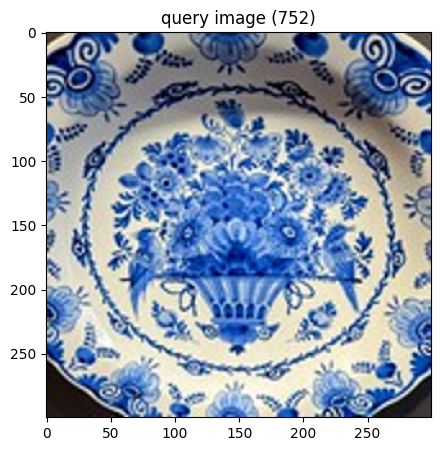

In [148]:
# do a query on a random image
query_image_idx = int(len(images) * random.random())
idx_closest = get_closest_images(query_image_idx)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

# display the query image
plt.figure(figsize = (5,5))
plt.imshow(query_image)
plt.title("query image (%d)" % query_image_idx)

Text(0.5, 1.0, 'result images')

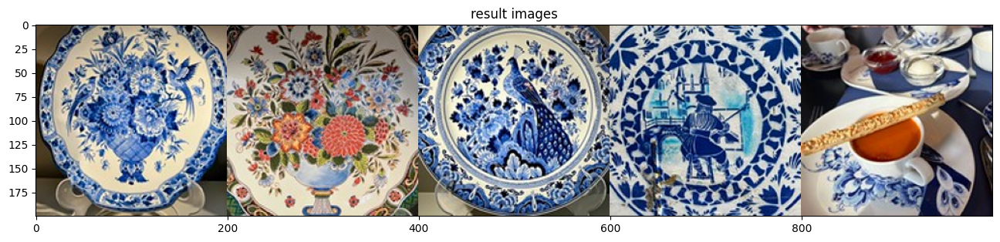

In [149]:
# display the resulting images
plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")

Text(0.5, 1.0, 'query image (128)')

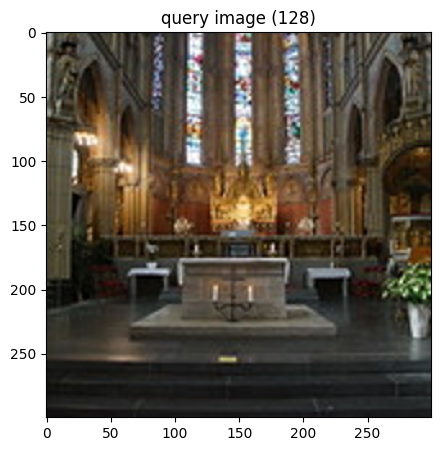

In [166]:
# do a query on a random image
query_image_idx = int(len(images) * random.random())
idx_closest = get_closest_images(query_image_idx)
query_image = get_concatenated_images([query_image_idx], 300)
results_image = get_concatenated_images(idx_closest, 200)

# display the query image
plt.figure(figsize = (5,5))
plt.imshow(query_image)
plt.title("query image (%d)" % query_image_idx)

Text(0.5, 1.0, 'result images')

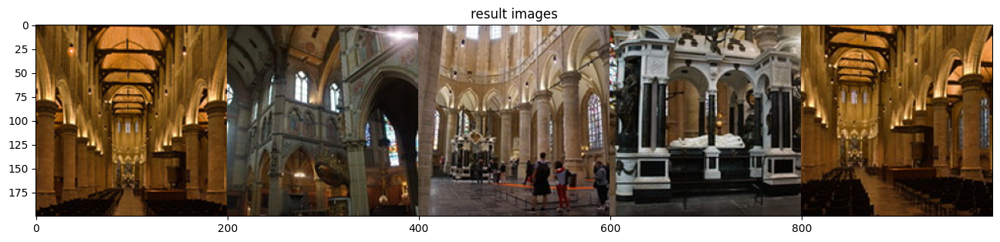

In [167]:
# display the resulting images
plt.figure(figsize = (16,12))
plt.imshow(results_image)
plt.title("result images")

#### Using t-SNE to visualize the similarities of images on 2D

In [173]:
with open(args.save_dir + 'feature_PCA.p', 'rb') as fp:
  images, pca_features, pca = pickle.load(fp)

In [174]:
num_images_to_plot = 1000
random.seed(1)
if len(images) > num_images_to_plot:
    sort_order = sorted(random.sample(range(len(images)), num_images_to_plot))
    images = [images[i] for i in sort_order]
    pca_features = [pca_features[i] for i in sort_order]

In [175]:
X = np.array(pca_features)
tsne = TSNE(n_components=2, learning_rate=150, perplexity=30, angle=0.2, verbose=2).fit_transform(X)

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1000 samples in 0.001s...
[t-SNE] Computed neighbors for 1000 samples in 0.083s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1000
[t-SNE] Mean sigma: 21.497350
[t-SNE] Computed conditional probabilities in 0.073s
[t-SNE] Iteration 50: error = 70.3155060, gradient norm = 0.1201861 (50 iterations in 2.998s)
[t-SNE] Iteration 100: error = 70.8758545, gradient norm = 0.1028225 (50 iterations in 1.082s)
[t-SNE] Iteration 150: error = 70.4990616, gradient norm = 0.1213044 (50 iterations in 0.846s)
[t-SNE] Iteration 200: error = 71.1275101, gradient norm = 0.1597158 (50 iterations in 0.817s)
[t-SNE] Iteration 250: error = 69.8984756, gradient norm = 0.1471156 (50 iterations in 0.867s)
[t-SNE] KL divergence after 250 iterations with early exaggeration: 69.898476
[t-SNE] Iteration 300: error = 1.4355279, gradient norm = 0.0067248 (50 iterations in 0.763s)
[t-SNE] Iteration 350: error = 1.3233438, gradient norm = 0.0050

In [176]:
len(X)

1000

In [177]:
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

<ipython-input-178-809a09023e91>:9: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)


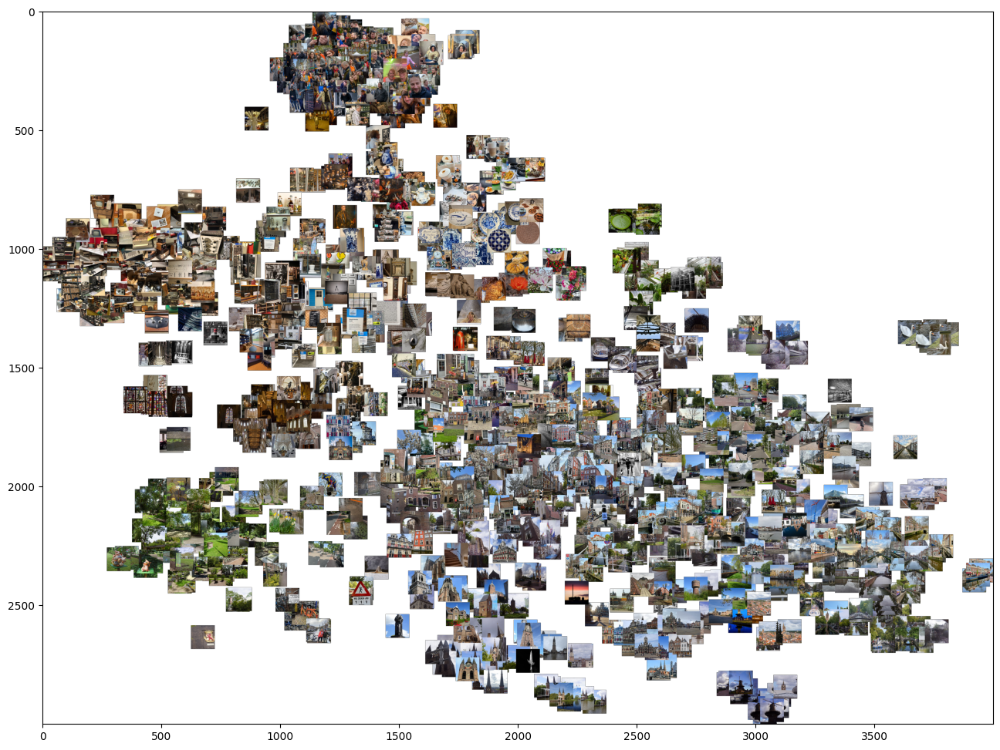

In [178]:
width = 4000
height = 3000
max_dim = 100

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(images, tx, ty):
    tile = Image.open(img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width-max_dim)*x), int((height-max_dim)*y)), mask=tile.convert('RGBA'))

plt.figure(figsize = (16,12))
plt.imshow(full_image)

In [134]:
full_image.save(args.save_dir + "tSNE_300.png")

In [179]:
full_image.save(args.save_dir + "tSNE_1000.png")

In [135]:
tsne_path = args.save_dir + "tSNE_300.json"

data = [{"path":os.path.abspath(img), "point":[float(x), float(y)]} for img, x, y in zip(images, tx, ty)]
with open(tsne_path, 'w') as outfile:
    json.dump(data, outfile)

print("saved t-SNE result to %s" % tsne_path)

saved t-SNE result to /content/drive/MyDrive/FCIC_workshop/Delf Campus/data_storage/tSNE_300.json


In [180]:
tsne_path = args.save_dir + "tSNE_1000.json"

data = [{"path":os.path.abspath(img), "point":[float(x), float(y)]} for img, x, y in zip(images, tx, ty)]
with open(tsne_path, 'w') as outfile:
    json.dump(data, outfile)

print("saved t-SNE result to %s" % tsne_path)

saved t-SNE result to /content/drive/MyDrive/FCIC_workshop/Delf Campus/data_storage/tSNE_1000.json


#### Stretching the TSNE visualization into a grid

In [72]:
!pip install rasterfairy

  Preparing metadata (setup.py) ... done
  Created wheel for rasterfairy: filename=rasterfairy-1.0.6-py3-none-any.whl size=29530 sha256=01f0af45fd98422ee0a678eef8961899f9017dd98d0fdb5380295cdf6a377ef4
  Stored in directory: /root/.cache/pip/wheels/96/22/02/8d803d027886f08306053833a687b5a5f7f052d1b8b00462d8
Successfully built rasterfairy


/usr/local/lib/python3.10/dist-packages/google/colab/_pip.py:86: ResourceWarning: unclosed file <_io.TextIOWrapper name='/usr/local/lib/python3.10/dist-packages/rasterfairy-1.0.6.dist-info/top_level.txt' mode='r' encoding='UTF-8'>
  for line in open(toplevel):


In [181]:
tsne.shape

(1000, 2)

In [84]:
import numpy as np
np.__version__

/usr/local/lib/python3.10/dist-packages/ipykernel/ipkernel.py:283: DeprecationWarning: `should_run_async` will not call `transform_cell` automatically in the future. Please pass the result to `transformed_cell` argument and any exception that happen during thetransform in `preprocessing_exc_tuple` in IPython 7.17 and above.
  and should_run_async(code)


'1.25.2'

##### RasterFairy

In [87]:
def transformPointCloud2D( points2d, target = None, autoAdjustCount = True, proportionThreshold = 0.4):
    pointCount = len(points2d)
    rasterMask = None

    if target is None:
        target = getRectArrangements(pointCount)[0]
        if float(target[0]) / float(target[1])<proportionThreshold:
            width = int(math.sqrt(pointCount))
            height = int(math.ceil(float(pointCount)/float(width)))
            print("no good rectangle found for",pointCount,"points, using incomplete square",width,"*",height)
            target = {'width':width,'height':height,'mask':np.zeros((height,width),dtype=int), 'count':width*height, 'hex': False}

    if type(target) is tuple and len(target)==2:
        #print "using rectangle target"
        if target[0] * target[1] < pointCount:
            print("ERROR: target rectangle is too small to hold data: Rect is",target[0],"*",target[1],"=",target[0] * target[1]," vs ",pointCount," data points")
            return False
        width = target[0]
        height = target[1]

    elif "PIL." in str(type(target)):
        #print "using bitmap image target"
        rasterMask = getRasterMaskFromImage(target)
        width = rasterMask['width']
        height = rasterMask['height']
    elif 'mask' in target and 'count' in target and 'width' in target and 'height' in target:
        #print "using raster mask target"
        rasterMask = target
        width = rasterMask['width']
        height = rasterMask['height']

    if not (rasterMask is None) and rasterMask['mask'].shape[0]*rasterMask['mask'].shape[1]-np.sum( rasterMask['mask'].flat) < len(points2d):
        print("ERROR: raster mask target does not have enough grid points to hold data")
        return False

    if not (rasterMask is None) and (rasterMask['count']!=len(points2d)):
        mask = rasterMask['mask'].flatten()
        count = len(points2d)
        if autoAdjustCount is True:

            if count > rasterMask['count']:
                ones = np.nonzero(mask)[0]
                np.random.shuffle(ones)
                mask[ones[0:count-rasterMask['count']]] = 0
            elif count < rasterMask['count']:
                zeros = np.nonzero(1-mask)[0]
                np.random.shuffle(zeros)
                mask[zeros[0:rasterMask['count']-count]] = 1
        else:
            if count > rasterMask['count']:
                ones = np.nonzero(mask)[0]
                mask[ones[rasterMask['count']]-count:] = 0
            elif count < rasterMask['count']:
                zeros = np.nonzero(1-mask)[0]
                mask[zeros[rasterMask['count']-count]] = 1

        mask = mask.reshape((rasterMask['height'], rasterMask['width']))
        rasterMask = {'width':rasterMask['width'],'height':rasterMask['height'],'mask':mask, 'count':count, 'hex': rasterMask['hex']}
    quadrants = [{'points':points2d, 'grid':[0,0,width,height], 'indices':np.arange(pointCount)}]
    i = 0
    failedSlices = 0
    while i < len(quadrants) and len(quadrants) < pointCount:
        if ( len(quadrants[i]['points']) > 1 ):
            slices = sliceQuadrant(quadrants[i], mask = rasterMask)
            if len(slices)>1:
                del quadrants[i]
                quadrants += slices
                i = 0
            else:
                failedSlices += 1
        else:
            i+=1
    if failedSlices>0:
        print("WARNING - There might be a problem with the data. Try using autoAdjustCount=True as a workaround or check if you have points with identical coordinates in your set.")

    gridPoints2d = points2d.copy()

    if not (rasterMask is None) and rasterMask['hex'] is True:
        f = math.sqrt(3.0)/2.0
        offset = -0.5
        if np.argmin(rasterMask['mask'][0]) > np.argmin(rasterMask['mask'][1]):
            offset = 0.5
        for q in quadrants:
            if q['grid'][1]%2==0:
                q['grid'][0]-=offset
            q['grid'][1] *= f

    for q in quadrants:
        gridPoints2d[q['indices'][0]] = np.array(q['grid'][0:2],dtype=float)

    return gridPoints2d, (width, height)

def sliceQuadrant( quadrant, mask = None ):

    xy = quadrant['points']
    grid = quadrant['grid']
    indices = quadrant['indices']
    slices = []

    if mask is None:

        if grid[2]>1:
            sliceXCount = 2
            while (grid[2]%sliceXCount!=0):
                sliceXCount+=1
        else:
            sliceXCount = grid[3]

        if grid[3]>1:
            sliceYCount = 2
            while (grid[3]%sliceYCount!=0):
                sliceYCount+=1
        else:
            sliceYCount = grid[2]

        splitX = (sliceXCount<sliceYCount or (sliceXCount==sliceYCount and grid[2]>grid[3]))
        if splitX:
            order = np.lexsort((xy[:,1].astype(int),xy[:,0].astype(int)))
            sliceCount = sliceXCount
            sliceSize  = grid[2] / sliceCount
            pointsPerSlice = grid[3] * sliceSize
            gridOffset = grid[0]
        else:
            order = np.lexsort((xy[:,0].astype(int),xy[:,1].astype(int)))
            sliceCount = sliceYCount
            sliceSize = grid[3] / sliceCount
            pointsPerSlice = grid[2] * sliceSize
            gridOffset = grid[1]
        for i in range(sliceCount):
            sliceObject = {}
            # HOTFIX: indices must be integers!
            pointsPerSlice = int(pointsPerSlice)
            sliceObject['points'] = xy[order[i*pointsPerSlice:(i+1)*pointsPerSlice]]
            if len(sliceObject['points'])>0:
                sliceObject['indices'] = indices[order[i*pointsPerSlice:(i+1)*pointsPerSlice]]
                if splitX:
                    sliceObject['grid'] = [gridOffset,grid[1],sliceSize,grid[3]]
                    gridOffset += sliceObject['grid'][2]
                else:
                    sliceObject['grid'] = [grid[0],gridOffset,grid[2],sliceSize]
                    gridOffset += sliceObject['grid'][3]
                slices.append(sliceObject)

    else:

        maskSlice = mask['mask'][grid[1]:grid[1]+grid[3],grid[0]:grid[0]+grid[2]]
        cols,rows = maskSlice.shape
        pointCountInMask = min(cols*rows - np.sum(maskSlice),len(indices))
        columnCounts = cols - np.sum(maskSlice, axis=0)
        splitColumn = countX  = 0
        while splitColumn < rows and countX < (pointCountInMask>>1):
            countX += columnCounts[splitColumn]
            splitColumn+=1

        rowCounts = rows-np.sum(maskSlice,axis=1)
        splitRow = countY = 0
        while splitRow < cols and countY < (pointCountInMask>>1):
            countY += rowCounts[splitRow]
            splitRow+=1

        order = np.lexsort((xy[:,1].astype(int),xy[:,0].astype(int)))
        slicesX = []
        if countX > 0:
            sliceObject = {}
            newOrder = order[:countX]
            sliceObject['points'] = xy[newOrder]
            sliceObject['indices'] = indices[newOrder]
            sliceObject['grid'] = [grid[0], grid[1], splitColumn, grid[3]]
            cropGrid(mask['mask'],sliceObject['grid'])
            slicesX.append(sliceObject)

        if countX < len(order):
            sliceObject = {}
            newOrder = order[countX:]
            sliceObject['points'] = xy[newOrder]
            sliceObject['indices'] = indices[newOrder]
            sliceObject['grid'] = [grid[0]+splitColumn, grid[1], grid[2]-splitColumn, grid[3]]
            cropGrid(mask['mask'],sliceObject['grid'])
            slicesX.append(sliceObject)

        order = np.lexsort((xy[:,0].astype(int),xy[:,1].astype(int)))
        slicesY = []
        if countY > 0:
            sliceObject = {}
            newOrder = order[:countY]
            sliceObject['points'] = xy[newOrder]
            sliceObject['indices'] = indices[newOrder]
            sliceObject['grid'] = [grid[0], grid[1], grid[2],splitRow]
            cropGrid(mask['mask'],sliceObject['grid'])
            slicesY.append(sliceObject)

        if countY < len(order):
            sliceObject = {}
            newOrder = order[countY:]
            sliceObject['points'] = xy[newOrder]
            sliceObject['indices'] = indices[newOrder]
            sliceObject['grid'] = [grid[0], grid[1]+splitRow, grid[2], grid[3]-splitRow]
            cropGrid(mask['mask'],sliceObject['grid'])
            slicesY.append(sliceObject)

        if len(slicesX)==1:
            slices = slicesY
        elif len(slicesY)==1:
            slices = slicesX
        else:
            prop1 = float(slicesX[0]['grid'][2]) / float(slicesX[0]['grid'][3])
            prop2 = float(slicesX[1]['grid'][2]) / float(slicesX[1]['grid'][3])
            if prop1 > 1.0:
                prop1 = 1.0 / prop1
            if prop2 > 1.0:
                prop2 = 1.0 / prop2
            ratioX = max(abs(1.0 - prop1),abs(1.0 - prop2))

            prop1 = float(slicesY[0]['grid'][2]) / float(slicesY[0]['grid'][3])
            prop2 = float(slicesY[1]['grid'][2]) / float(slicesY[1]['grid'][3])
            if prop1 > 1.0:
                prop1 = 1.0 / prop1
            if prop2 > 1.0:
                prop2 = 1.0 / prop2
            ratioY = max(abs(1.0 - prop1),abs(1.0 - prop2))
            if ratioX < ratioY:
                slices = slicesX
            else:
                slices = slicesY

    return slices

def cropGrid(mask,grid):
    maskSlice = mask[grid[1]:grid[1]+grid[3],grid[0]:grid[0]+grid[2]]
    cols,rows = maskSlice.shape
    columnCounts = cols - np.sum(maskSlice, axis=0)
    for i in range(len(columnCounts)):
        if columnCounts[i]>0:
            break
        grid[0]+=1
        grid[2]-=1

    for i in range(len(columnCounts)-1,-1,-1):
        if columnCounts[i]>0:
            break
        grid[2]-=1

    rowCounts = rows-np.sum(maskSlice,axis=1)
    for i in range(len(rowCounts)):
        if rowCounts[i]>0:
            break
        grid[1]+=1
        grid[3]-=1

    for i in range(len(rowCounts)-1,-1,-1):
        if rowCounts[i]>0:
            break
        grid[3]-=1


def getRasterMaskFromImage( img ):
    img = img.convert('1')
    mask = np.array(img.getdata())&1
    return {'width':img.width,'height':img.height,'mask':mask.reshape((img.height, img.width)), 'count':len(mask)- np.sum(mask), 'hex':False}


def getCircleRasterMask( r, innerRingRadius = 0, rasterCount = None, autoAdjustCount = True  ):

    d = r*2+1
    p = np.ones((d,d),dtype=int)
    IG = (r<<1) - 3
    IDGR = -6
    IDGD = (r<<2) - 10

    IX = 0
    IY = r

    while IY >= IX:
        p[r-IX:r+IX+1,r+IY] = p[r-IX:r+IX+1,r-IY] = p[r-IY:r+IY+1,r+IX] = p[r-IY:r+IY+1,r-IX] = 0
        if IG<0:
            IG = IG+IDGD
            IDGD -= 8
            IY-=1
        else:
            IG += IDGR
            IDGD -=4
        IDGR -= 4
        IX+=1

    if innerRingRadius > 0 and innerRingRadius < r:
        r2 = r
        r = innerRingRadius
        IG = (r<<1) - 3
        IDGR = -6
        IDGD = (r<<2) - 10

        IX = 0
        IY = r

        while IY >= IX:
            p[r2-IX:r2+IX+1,r2+IY] = p[r2-IX:r2+IX+1,r2-IY] = p[r2-IY:r2+IY+1,r2+IX] = p[r2-IY:r2+IY+1,r2-IX] = 1
            if IG<0:
                IG = IG+IDGD
                IDGD -= 8
                IY-=1
            else:
                IG += IDGR
                IDGD -=4
            IDGR -= 4
            IX+=1


    count = p.shape[0] * p.shape[1] - np.sum(p.flat)
    if not rasterCount is None and autoAdjustCount and count != rasterCount:
        p = p.flatten()&1
        if count < rasterCount:
            ones = np.nonzero(p)[0]
            np.random.shuffle(ones)
            p[ones[0:rasterCount-count]] = 0
            count = rasterCount
        elif count > rasterCount:
            zeros = np.nonzero(1-p)[0]
            np.random.shuffle(zeros)
            p[zeros[0:count-rasterCount]] = 1
            count = rasterCount
        p = p.reshape((d,d))
    #print("adjusted count",p.shape[0] * p.shape[1]- np.sum(p))
    return {'width':d,'height':d,'mask':p, 'count':count}

def getRectArrangements(n):
    p = prime.Prime()
    f = p.getPrimeFactors(n)
    f_count = len(f)
    ma = multiplyArray(f)
    arrangements = set([(1,ma)])

    if (f_count > 1):
        perms = set(p.getPermutations(f))
        for perm in perms:
            for i in range(1,f_count):
                v1 = multiplyArray(perm[0:i])
                v2 = multiplyArray(perm[i:])
                arrangements.add((min(v1, v2),max(v1, v2)))

    return sorted(list(arrangements), key=cmp_to_key(proportion_sort), reverse=True)

def getShiftedAlternatingRectArrangements(n):
    arrangements = set([])
    for x in range(1,n >> 1):
        v = 2 * x + 1
        if n % v == x:
            arrangements.add((x, x + 1, ((n // v) | 0) * 2 + 1))

    for x in range(2,1 + (n >> 1)):
        v = 2 * x - 1
        if n % v == x:
            arrangements.add((x, x - 1, ((n // v) | 0) * 2 + 1))

    result = []
    for a in arrangements:
        nn = n
        d = []
        i = 0
        while nn > 0:
            d.append(a[i])
            nn-=a[i]
            i = 1 - i
        result.append({'hex':True,'rows':d,'type':'alternating'})
    return result


def getShiftedSymmetricArrangements(n):
    hits = []
    for i in range(1, n >> 1):
        d = []
        count = n
        row = i
        d.append(row)
        while True:
            count -= row * 2
            if count == row + 1:
                if i != row:
                    d.append(row+1)
                    d+=d[0:-1][::-1]
                    hits.append({'hex':True,'rows':d,'type':'symmetric'})
                    break
            elif count <= 0:
                break
            row+=1
            d.append(row)
    return hits

def getShiftedTriangularArrangement(n):

    t = math.sqrt(8 * n + 1);
    if t != math.floor(t):
        return []

    arrangement = []
    i = 1
    while n>0:
        arrangement.append(i)
        n-=i
        i+=1

    return [{'hex':True,'rows':arrangement,'type':'triangular'}]

def getAlternatingRectArrangements(n):
    arrangements = set([])
    for x in range(1,n >> 1):
        v = 2 * x + 2
        if n % v == x:
            arrangements.add((x, x + 2, ((n // v) | 0) * 2 + 1))

    for x in range(2,1 + (n >> 1)):
        v = 2 * x - 2
        if n % v == x:
            arrangements.add((x, x -2, ((n // v) | 0) * 2 + 1))

    result = []
    for a in arrangements:
        nn = n
        d = []
        i = 0
        while nn > 0:
            d.append(a[i])
            nn-=a[i]
            i = 1 - i
        result.append({'hex':False,'rows':d,'type':'alternating'})
    return result

def getSymmetricArrangements(n):
    hits = []
    for i in range(1, n >> 1):
        d = []
        count = n
        row = i
        d.append(row)
        while True:
            count -= row * 2
            if count == row + 2:
                if i != row:
                    d.append(row+2)
                    d+=d[0:-1][::-1]
                    hits.append({'hex':False,'rows':d,'type':'symmetric'})
                    break
            elif count <= 0:
                break
            row+=2
            d.append(row)
    return hits

def getTriangularArrangement(n):

    t = math.sqrt(n);
    if t != math.floor(t):
        return []

    arrangement = []
    i = 1
    while n>0:
        arrangement.append(i)
        n-=i
        i+=2

    return [{'hex':False,'rows':arrangement,'type':'triangular'}]


def getArrangements(n, includeHexagonalArrangements = True,includeRectangularArrangements = True):
    r = []
    if includeHexagonalArrangements:
        r += getShiftedAlternatingRectArrangements(n)
        r += getShiftedSymmetricArrangements(n)
        r += getShiftedTriangularArrangement(n)
    if includeRectangularArrangements:
        r += getAlternatingRectArrangements(n)
        r += getSymmetricArrangements(n)
        r += getTriangularArrangement(n)
        bestr,bestrp,bestc = getBestCircularMatch(n)
        if bestc == n:
            r.append( getCircularArrangement(bestr,bestrp))
    return r

def arrangementListToRasterMasks( arrangements ):
    masks = []
    for i in range(len(arrangements)):
        masks.append(arrangementToRasterMask(arrangements[i]))
    return sorted(masks, key=cmp_to_key(arrangement_sort), reverse=True)

def arrangementToRasterMask( arrangement ):
    rows = np.array(arrangement['rows'])
    width = np.max(rows)
    if arrangement['hex'] is True:
        width+=1
    height = len(rows)
    mask = np.ones((height,width),dtype=int)
    for row in range(len(rows)):
        c = rows[row]
        mask[row,(width-c)>>1:((width-c)>>1)+c] = 0

    return {'width':width,'height':height,'mask':mask, 'count':np.sum(rows),'hex':arrangement['hex'],'type':arrangement['type']}

def rasterMaskToGrid( rasterMask ):
    grid = []
    mask = rasterMask['mask']
    for y in range(rasterMask['height']):
        for x in range(rasterMask['width']):
            if mask[y,x]==0:
                grid.append([x,y])

    grid = np.array(grid,dtype=float)
    if not (rasterMask is None) and rasterMask['hex'] is True:
        f = math.sqrt(3.0)/2.0
        offset = -0.5
        if np.argmin(rasterMask['mask'][0]) > np.argmin(rasterMask['mask'][1]):
            offset = 0.5
        for i in range(len(grid)):
            if (grid[i][1]%2.0==0.0):
                grid[i][0]-=offset
            grid[i][1] *= f
    return grid


def getBestCircularMatch(n):
    bestc = n*2
    bestr = 0
    bestrp = 0.0

    minr = int(math.sqrt(n / math.pi))
    for rp in range(0,10):
        rpf = float(rp)/10.0
        for r in range(minr,minr+3):
            rlim = (r+rpf)*(r+rpf)
            c = 0
            for y in range(-r,r+1):
                yy = y*y
                for x in range(-r,r+1):
                    if x*x+yy<rlim:
                        c+=1
            if c == n:
                return r,rpf,c

            if c>n and c < bestc:
                bestrp = rpf
                bestr = r
                bestc = c
    return bestr,bestrp,bestc

def getCircularArrangement(radius,adjustFactor):
    rows = np.zeros( radius*2+1,dtype=int )

    rlim = (radius+adjustFactor)*(radius+adjustFactor)
    for y in range(-radius,radius+1):
        yy = y*y
        for x in range(-radius,radius+1):
            if x*x+yy<rlim:
                rows[radius+y]+=1

    return {'hex':False,'rows':rows,'type':'circular'}

def arrangement_sort(x, y):
    return int(100000000*(abs(float(min(x['width'],x['height'])) / float(max(x['width'],x['height']))) - abs(float(min(y['width'],y['height'])) / float(max(y['width'],y['height'])))))

def proportion_sort(x, y):
    return int(100000000*(abs(float(min(x[0],x[1])) / float(max(x[0],x[1]))) - abs(float(min(y[0],y[1])) / float(max(y[0],y[1])))))

def multiplyArray(a):
    f = 1
    for v in a:
        f *= v
    return f

##### RasterFairy

In [182]:
import rasterfairy

# nx * ny = 200, the number of images
nx = 50
ny = 20

# assign to grid
grid_assignment = transformPointCloud2D(tsne, target=(nx, ny))

<ipython-input-183-65f548a41a6a>:22: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use LANCZOS or Resampling.LANCZOS instead.
  tile = tile.resize((tile_width, tile_height), Image.ANTIALIAS)


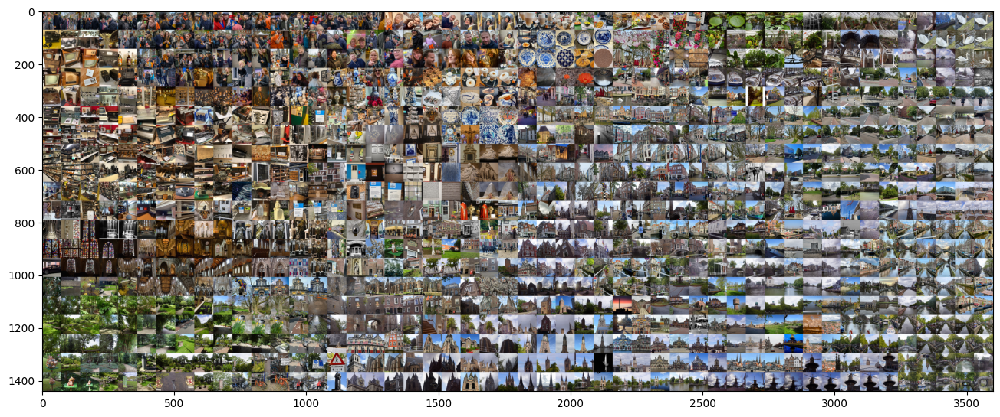

In [183]:
tile_width = 72
tile_height = 72

full_width = tile_width * nx
full_height = tile_height * ny
aspect_ratio = float(tile_width) / tile_height

grid_image = Image.new('RGB', (full_width, full_height))

for img, grid_pos in zip(images, grid_assignment[0]):
    idx_x, idx_y = grid_pos
    x, y = tile_width * idx_x, tile_height * idx_y

    tile = Image.open(img)
    tile_ar = float(tile.width) / tile.height  # center-crop the tile to match aspect_ratio
    if (tile_ar > aspect_ratio):
        margin = 0.5 * (tile.width - aspect_ratio * tile.height)
        tile = tile.crop((margin, 0, margin + aspect_ratio * tile.height, tile.height))
    else:
        margin = 0.5 * (tile.height - float(tile.width) / aspect_ratio)
        tile = tile.crop((0, margin, tile.width, margin + float(tile.width) / aspect_ratio))
    tile = tile.resize((tile_width, tile_height), Image.ANTIALIAS)
    grid_image.paste(tile, (int(x), int(y)))

plt.figure(figsize = (16,12))
plt.imshow(grid_image)

In [184]:
grid_image.save(args.save_dir + "grid_1000.jpg")

This is a collage with very small number of images. If extended to larger number, images with much more insights can be generated.

See the following an example created with 1000 images in Testaccio area in Rome (Bai et al., 2023).

![<img src="image.png" width="2000"/>](https://drive.google.com/uc?id=1RHQ_MKroe6WSJLLjBZ88dNiGTgEkMBHq)



### Text Processing using AI Models

#### Preprocessing of Textual Information

A subset that has textual information of Description, Title, and Tags

In [92]:
import re
img_df['tag_list'] = img_df['tags'].apply(lambda x: re.findall(r'_content\': \'([a-zA-Z]+)',x))
img_df['tag_len'] = img_df['tag_list'].apply(lambda x: len(x))

In [93]:
df_new = img_df[~((img_df['description'].isnull())|(img_df['title'].isnull())|(img_df['tag_len']==0))]
df_new

,ids,candownload,url_q,owner,owner_loc,title,description,comments,taken,views,people,tags,lat,lon,neighbourhood,url,date,tag_list,tag_len
235,53651618350,1,https://live.staticflickr.com/65535/5365161835...,33268943@N00,NaN,2024-0407,Wandelen buiten de binnenstad van Delft.\nEtap...,0,2024-04-10 16:30:53,1,0,"[{'id': '4797818-53651618350-7568', 'author': ...",52.006419,4.357108,NaN,https://www.flickr.com/photos/schuttermajoor/5...,2024,"[nederland, delft, park, wandelenbuitendebinne...",6
236,53651509244,1,https://live.staticflickr.com/65535/5365150924...,33268943@N00,NaN,2024-0406,Wandelen buiten de binnenstad van Delft.\nEtap...,0,2024-04-10 16:27:51,1,0,"[{'id': '4797818-53651509244-7568', 'author': ...",52.005191,4.359016,NaN,https://www.flickr.com/photos/schuttermajoor/5...,2024,"[nederland, delft, westsingelgracht, wandelenb...",4
237,53651509069,1,https://live.staticflickr.com/65535/5365150906...,33268943@N00,NaN,2024-0404,Wandelen buiten de binnenstad van Delft.\nEtap...,0,2024-04-10 16:19:10,0,0,"[{'id': '4797818-53651509069-7568', 'author': ...",52.001227,4.359313,NaN,https://www.flickr.com/photos/schuttermajoor/5...,2024,"[nederland, delft, park, wandelenbuitendebinne...",8
238,53650288532,1,https://live.staticflickr.com/65535/5365028853...,33268943@N00,NaN,2024-0400,Wandelen buiten de binnenstad van Delft.\nEtap...,0,2024-04-10 16:05:43,4,0,"[{'id': '4797818-53650288532-7568', 'author': ...",51.997686,4.354469,NaN,https://www.flickr.com/photos/schuttermajoor/5...,2024,"[nederland, delft, wandelenbuitendebinnenstadv...",8
239,53651508624,1,https://live.staticflickr.com/65535/5365150862...,33268943@N00,NaN,2024-0399,Wandelen buiten de binnenstad van Delft.\nEtap...,0,2024-04-10 16:04:58,0,0,"[{'id': '4797818-53651508624-7568', 'author': ...",51.997505,4.354775,NaN,https://www.flickr.com/photos/schuttermajoor/5...,2024,"[nederland, delft, wandelenbuitendebinnenstadv...",7
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2945,52679251965,0,https://live.staticflickr.com/65535/5267925196...,13735648@N05,"Rotterdam, Netherlands",2023_365_039,The so called 3ME building at the TU-Delft jus...,2,2023-02-08 18:10:55,64,0,"[{'id': '13730308-52679251965-38042', 'author'...",52.001447,4.372213,NaN,https://www.flickr.com/photos/seustace2003/526...,2023,"[bas, pays, netherlands, holland, delft, neder...",7
2946,52677196811,1,https://live.staticflickr.com/65535/5267719681...,127554398@N02,NaN,Delft - Maria van Jessekerk,De Maria van Jessekerk is een neogotische room...,0,2023-01-20 14:16:16,371,0,"[{'id': '127534050-52677196811-9464', 'author'...",52.011745,4.360681,NaN,https://www.flickr.com/photos/johanbakker/5267...,2023,"[delft, zuid, holland, netherlands, nederland,...",21
2947,52677194096,1,https://live.staticflickr.com/65535/5267719409...,127554398@N02,NaN,Delft - Maria van Jessekerk,De Maria van Jessekerk is een neogotische room...,0,2023-01-20 14:29:44,391,0,"[{'id': '127534050-52677194096-9464', 'author'...",52.011725,4.361046,NaN,https://www.flickr.com/photos/johanbakker/5267...,2023,"[delft, zuid, holland, netherlands, nederland,...",21
2948,52674733313,1,https://live.staticflickr.com/65535/5267473331...,52122658@N00,Amsterdam,Crooked smile,[IMG_4034],1,2023-02-05 11:43:41,112,0,"[{'id': '623689-52674733313-1071', 'author': '...",52.009513,4.356091,NaN,https://www.flickr.com/photos/driek/52674733313/,2023,"[stone, smile]",2


In [94]:
df_new['tag_text'] = df_new['tag_list'].apply(lambda x: ', '.join(x))
df_new['TEXTS'] = 'Title: ' + df_new['title'] + '. Description: '+ df_new['description'] + '. Tags: '+ df_new['tag_text']

<ipython-input-94-477ab344b044>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['tag_text'] = df_new['tag_list'].apply(lambda x: ', '.join(x))
<ipython-input-94-477ab344b044>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['TEXTS'] = 'Title: ' + df_new['title'] + '. Description: '+ df_new['description'] + '. Tags: '+ df_new['tag_text']


In [95]:
df_new['TEXTS'].iloc[10]

'Title: 2024-0381. Description: Wandelen buiten de binnenstad van Delft.\nEtappe 2: wandelingen 2 en 6.\nGelopen: woensdag 10 april 2024.\nNa de Buitenwatersloot over te zijn gestoken ging ik op weg naar de na 1960 gerealiseerde woonwijken van Delft-Zuid. Onderweg daar naar toe passeerde ik de plek waar tussen 1471 en 1592 het Karthuizer klooster &quot;Sint Bartholomeus in Jersusalem&quot; heeft gestaan. Het bestaan van dit klooster was min of meer vergeten totdat men bij de bouw van een nieuw ziekenhuis in 1959 op de fundamenten er van stuitte. Betegeling in het gras markeren de contouren van het klooster. Het ziekenhuis bestaat trouwens ook niet meer. Het is omgebouwd tot een appartementencomplex.. Tags: nederland, delft, monument, wandelenbuitendebinnenstadvandelft, karthuizerklooster'

In [96]:
candidates = df_new['TEXTS'].drop_duplicates(keep='first')
len(candidates)

330

In [97]:
candidates

235     Title: 2024-0407. Description: Wandelen buiten...
236     Title: 2024-0406. Description: Wandelen buiten...
237     Title: 2024-0404. Description: Wandelen buiten...
238     Title: 2024-0400. Description: Wandelen buiten...
239     Title: 2024-0399. Description: Wandelen buiten...
                              ...                        
2942    Title: 20220318-Canon EOS 80D-9702. Descriptio...
2943    Title: Delft - Graftombe Maarten Tromp. Descri...
2944    Title: Delft - Oude Kerk. Description: De Oude...
2945    Title: 2023_365_039. Description: The so calle...
2948    Title: Crooked smile. Description: [IMG_4034]....
Name: TEXTS, Length: 330, dtype: object

#### Applying Sentiment Analysis

We define a function analyze_sentiment that takes a text as input, uses the NLTK library to perform sentiment analysis, and classifies the sentiment as positive, negative, or neutral.
The function is applied to the 'title' column of the DataFrame.

In [98]:
import pandas as pd

# Install necessary libraries
!pip install nltk

# Import libraries
import nltk
from nltk.sentiment import SentimentIntensityAnalyzer

# Download NLTK resources
nltk.download('vader_lexicon')

# Function for sentiment analysis
def analyze_sentiment(text):
    sid = SentimentIntensityAnalyzer()
    sentiment_score = sid.polarity_scores(text)['compound']

    if sentiment_score >= 0.05:
        return 'Positive'
    elif sentiment_score <= -0.05:
        return 'Negative'
    else:
        return 'Neutral'

# Apply sentiment analysis to the 'title' column
df_new['sentiment'] = df_new['TEXTS'].apply(analyze_sentiment)

# Display the DataFrame with sentiment analysis results
print("\nDataFrame with Sentiment Analysis:")
print(df_new[['TEXTS', 'sentiment']])


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
[nltk_data] Downloading package vader_lexicon to /root/nltk_data...
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHo


DataFrame with Sentiment Analysis:
                                                  TEXTS sentiment
235   Title: 2024-0407. Description: Wandelen buiten...   Neutral
236   Title: 2024-0406. Description: Wandelen buiten...   Neutral
237   Title: 2024-0404. Description: Wandelen buiten...  Negative
238   Title: 2024-0400. Description: Wandelen buiten...   Neutral
239   Title: 2024-0399. Description: Wandelen buiten...   Neutral
...                                                 ...       ...
2945  Title: 2023_365_039. Description: The so calle...   Neutral
2946  Title: Delft - Maria van Jessekerk. Descriptio...   Neutral
2947  Title: Delft - Maria van Jessekerk. Descriptio...   Neutral
2948  Title: Crooked smile. Description: [IMG_4034]....  Positive
2949  Title: Delft - Maria van Jessekerk. Descriptio...   Neutral

[411 rows x 2 columns]


<ipython-input-98-5f02da5b150a>:26: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['sentiment'] = df_new['TEXTS'].apply(analyze_sentiment)


Now, we want to visualize the result with a simple bar chart.

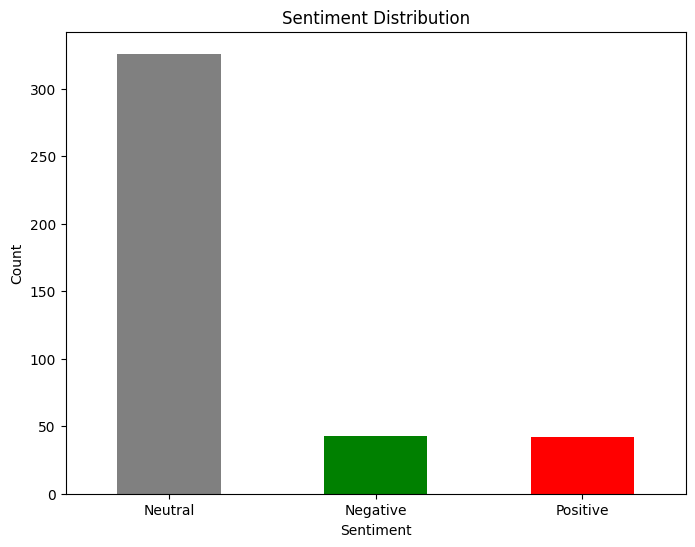

In [99]:
    # Sentiment Analysis Visualization
    sentiment_counts = df_new['sentiment'].value_counts()

    plt.figure(figsize=(8, 6))
    sentiment_counts.plot(kind='bar', color=['gray', 'green', 'red'])
    plt.title('Sentiment Distribution')
    plt.xlabel('Sentiment')
    plt.ylabel('Count')
    plt.xticks(rotation=0)
    plt.show()

####Applying Named Entity Recognition (NER)

We define a function apply_ner that takes a text as input, processes it using spaCy, and extracts named entities.
Named entities are entities like persons, organizations, locations, etc.
The function is applied to the 'description' column of the DataFrame.

In [100]:
# Install necessary libraries
!pip install spacy

# Import libraries
import spacy
import pandas as pd

# Load the spaCy English model
nlp = spacy.load("en_core_web_sm")

# Function for Named Entity Recognition (NER)
def apply_ner(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Apply NER to the 'description' column
df_new['named_entities'] = df_new['TEXTS'].apply(apply_ner)

# Display the DataFrame with NER results
print("\nDataFrame with Named Entity Recognition:")
print(df_new[['TEXTS', 'named_entities']])


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen impo


DataFrame with Named Entity Recognition:
                                                  TEXTS  \
235   Title: 2024-0407. Description: Wandelen buiten...   
236   Title: 2024-0406. Description: Wandelen buiten...   
237   Title: 2024-0404. Description: Wandelen buiten...   
238   Title: 2024-0400. Description: Wandelen buiten...   
239   Title: 2024-0399. Description: Wandelen buiten...   
...                                                 ...   
2945  Title: 2023_365_039. Description: The so calle...   
2946  Title: Delft - Maria van Jessekerk. Descriptio...   
2947  Title: Delft - Maria van Jessekerk. Descriptio...   
2948  Title: Crooked smile. Description: [IMG_4034]....   
2949  Title: Delft - Maria van Jessekerk. Descriptio...   

                                         named_entities  
235   [(2024-0407, DATE), (van Delft, ORG), (Etappe,...  
236   [(2024-0406, DATE), (van Delft, ORG), (Etappe,...  
237   [(2024-0404, DATE), (van Delft, ORG), (Etappe,...  
238   [(2024-0400

<ipython-input-100-b8ba45512f27>:18: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_new['named_entities'] = df_new['TEXTS'].apply(apply_ner)


Now, we want to provide some examples and visualize the result with a simple bar chart.

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.8/12.8 MB 16.1 MB/s eta 0:00:00
✔ Download and installation successful
You can now load the package via spacy.load('en_core_web_sm')
⚠ Restart to reload dependencies
If you are in a Jupyter or Colab notebook, you may need to restart Python in
order to load all the package's dependencies. You can do this by selecting the
'Restart kernel' or 'Restart runtime' option.


<frozen importlib._bootstrap>:914: ImportWarning: _PyDrive2ImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _PyDriveImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _GenerativeAIImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _OpenCVImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: APICoreClientInfoImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _BokehImportHook.find_spec() not found; falling back to find_module()
<frozen importlib._bootstrap>:914: ImportWarning: _AltairImportHook.find_spec() not found; falling back to find_module()


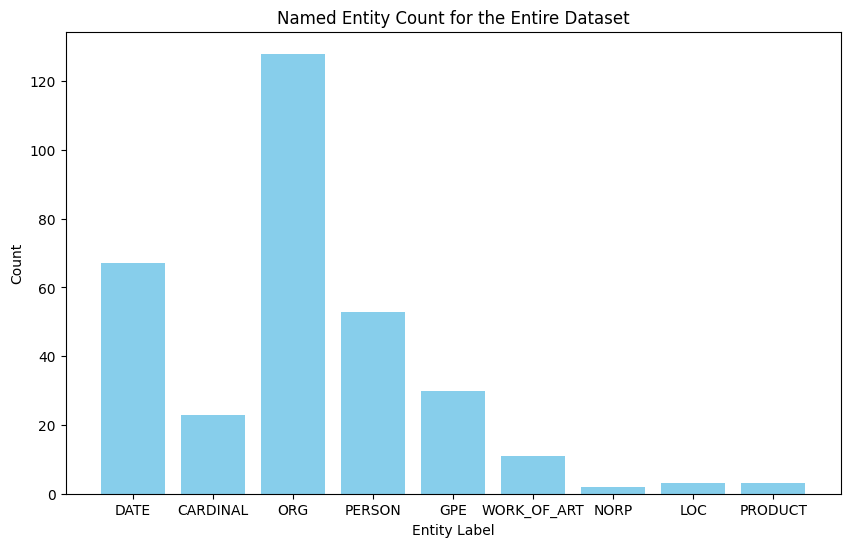


Named Entity Examples:

DATE Examples:
  - 2024-0407
  - 2024-0406
  - 2024-0404
  - 2024-0400
  - 2024-0399

CARDINAL Examples:
  - 12.27.48
  - Delft_2024.03.19 13.20.21
  - 12.28.04
  - 12.28.00
  - 12.28.06

ORG Examples:
  - Oostpoort
  - TU
  - Grote Markt
  - de Hollande
  - Grote Markt

PERSON Examples:
  - Bass
  - Nieuwe Kerk
  - Nieuwe Kerk
  - Stained Glass
  - Statue de Hugo de Groot

GPE Examples:
  - Delft
  - Delft
  - Delft
  - Keramiek
  - Delft

WORK_OF_ART Examples:
  - Pays-Bas
  - Pays-Bas
  - Pays-Bas
  - Pays-Bas
  - Pays-Bas

NORP Examples:
  - Angkor
  - Selfie

LOC Examples:
  - the Sint Jansbrug
  - the Sint Jansbrug
  - the Sint Jansbrug

PRODUCT Examples:
  - Leeuwebrug
  - Leeuwebrug
  - Linie 1


In [101]:
# Importing necessary libraries
from collections import Counter
import matplotlib.pyplot as plt
import pandas as pd
import spacy

# Download spaCy English model
!python -m spacy download en_core_web_sm

# Load spaCy model
nlp = spacy.load("en_core_web_sm")

# Function for Named Entity Recognition (NER)
def apply_ner(text):
    doc = nlp(text)
    entities = [(ent.text, ent.label_) for ent in doc.ents]
    return entities

# Function for visualizing named entities with count and examples for the entire dataset
def visualize_ner_with_count(dataset):
    # Count and examples of named entities for the entire dataset
    entity_count = Counter()
    entity_examples = {}

    for index, row in dataset.iterrows():
        doc = nlp(row['title'])
        entity_count.update([ent.label_ for ent in doc.ents])

        for ent_label in entity_count.keys():
            entity_examples.setdefault(ent_label, []).extend(
                [ent.text for ent in doc.ents if ent.label_ == ent_label][:3]
            )

    if not entity_count:
        print("No named entities found.")
        return

    # Bar chart for entity counts
    labels, counts = zip(*entity_count.items())
    plt.figure(figsize=(10, 6))
    plt.bar(labels, counts, color='skyblue')
    plt.title('Named Entity Count for the Entire Dataset')
    plt.xlabel('Entity Label')
    plt.ylabel('Count')
    plt.show()

    # Displaying 5 examples for each named entity label
    print("\nNamed Entity Examples:")
    for ent_label, examples in entity_examples.items():
        print(f"\n{ent_label} Examples:")
        for example in examples[:5]:
            print(f"  - {example}")

# Displaying the NER Visualization for the Entire Dataset
visualize_ner_with_count(df_new)

### Conclusion

Now you have the basic knowledge on how AI could be possibly use to collect social media posts from Flickr in your case study area. Keep us posted when you do find out some interesting facts.

#### Cite us as:

Bai, N., Ducci, M., Mirzikashvili, R., Nourian, P., and Pereira Roders, A.: MAPPING URBAN HERITAGE IMAGES WITH SOCIAL MEDIA DATA AND ARTIFICIAL INTELLIGENCE, A CASE STUDY IN TESTACCIO, ROME, Int. Arch. Photogramm. Remote Sens. Spatial Inf. Sci., XLVIII-M-2-2023, 139–146, https://doi.org/10.5194/isprs-archives-XLVIII-M-2-2023-139-2023, 2023.


Bai, N. (2023). Sensing the Cultural Significance with AI for Social Inclusion: A Computational Spatiotemporal Network-based Framework of Heritage Knowledge Documentation using User-Generated Content. [Dissertation (TU Delft), Delft University of Technology]. A+BE | Architecture and the Built Environment. https://doi.org/10.7480/abe.2023.17


Foroughi, M. (2023). Heritage Beyond Singular Narratives: Embracing Diversity in Participatory Heritage Planning Empowered by ­Artificial Intelligence. [Dissertation (TU Delft), Delft University of Technology]. https://doi.org/10.7480/abe.2023.19

Foroughi, M., de Andrade, B. and Roders, A.P., 2023. Capturing public voices: The role of social media in heritage management. Habitat International, 142, p.102934. https://doi.org/10.1016/j.habitatint.2023.102934

Foroughi, M., de Andrade, B. and Roders, A.P., 2022. Peoples’ values and feelings matter: participatory heritage management using social media. In Artificial Intelligence and Architectural Design: An Introduction (pp. 107-120). https://research.tudelft.nl/en/publications/peoples-values-and-feelings-matter-participatory-heritage-managem

#### Aknowledgement

Part of this notebook is based on and adapted from the notebooks by Stephen Law, Thomas Keel & Gong Jie for the course GEOG0051 Mining Social and Geographic Datasets at UCL.